In [1]:
import argparse
import time
import pdb

from anndata import AnnData
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader

from data import DatasetWithConfounder
from models import BatchDecoder
from models import HilbertSchmidtAE
from utils import configure_logging
from utils import embed_data, train
from utils import load_data
from utils import set_seeds

from desc_ethan import desc
import scvi
import shutil
from pathlib import Path

from utils import silhouette
from tqdm import tqdm
import pandas as pd
import numpy as np

from utils import ebm, knn_purity

configure_logging()
set_seeds(12345)

### Some graph setup stuff

In [2]:
import matplotlib

adata = load_data("pancreas_generalization", normalized=True)

adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.obs["study"] = adata.obs["study"].astype("category")

pancreas_study_cmap = matplotlib.cm.get_cmap("Dark2")
pancreas_study_cmap = [
    pancreas_study_cmap(0),
    pancreas_study_cmap(6),
    pancreas_study_cmap(4),
    pancreas_study_cmap(7),
    pancreas_study_cmap(5),
]

cell_cmap = matplotlib.cm.get_cmap("tab20")

pancreas_cell_cmap_map = {}
for i, cell_type in enumerate(adata.obs["cell_type"].unique()):
    pancreas_cell_cmap_map[cell_type] = cell_cmap(i)
    
pancreas_study_cmap_map = {}
for i, study in enumerate(adata.obs["study"].unique()):
    pancreas_study_cmap_map[study]= pancreas_study_cmap[i]
    
study_cmaps = {}
cell_type_cmaps = {}

study_cmaps["pancreas_generalization"] = pancreas_study_cmap_map
cell_type_cmaps["pancreas_generalization"] = pancreas_cell_cmap_map

adata = load_data("pbmc_generalization", normalized=True)

cell_cmap = matplotlib.cm.get_cmap("tab10_r")
pbmc_study_cmap = matplotlib.cm.get_cmap("Paired_r")

pbmc_cell_cmap_map = {}
for i, cell_type in enumerate(adata.obs["cell_type"].unique()):
    pbmc_cell_cmap_map[cell_type] = cell_cmap(i)

pbmc_study_cmap_map = {}
for i, study in enumerate(adata.obs["study"].unique()):
    pbmc_study_cmap_map[study]= pbmc_study_cmap(i)
pbmc_study_cmap_map['10x Chromium (v2) B'] = pbmc_study_cmap(11)
pbmc_study_cmap_map['Drop-seq'] = pbmc_study_cmap(10)

study_cmaps["pbmc_generalization"] = pbmc_study_cmap_map
cell_type_cmaps["pbmc_generalization"] = pbmc_cell_cmap_map

In [3]:
adata.obs["study"].unique()

array(['10x Chromium (v2) A', '10x Chromium (v2) B', '10x Chromium (v2)',
       '10x Chromium (v3)', 'CEL-Seq2', 'Drop-seq', 'Seq-Well',
       'Smart-seq2', 'inDrops'], dtype=object)

In [24]:
#for dataset in ["pancreas_generalization", "pbmc_generalization"]:
dataset = "pancreas_generalization"
adata = load_data(dataset, normalized=True)
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.obs["study"] = adata.obs["study"].astype("category")

source_batches = ["celseq", "indrop", "fluidigmc1"]
excluded_cells = ["alpha"]
source_adata = adata[adata.obs["study"].isin(source_batches)]
source_adata = source_adata[~source_adata.obs["cell_type"].isin(excluded_cells)]
target_adata = adata[~adata.obs["study"].isin(source_batches)]
query_adata = target_adata[target_adata.obs["study"].isin(["smartseq2", 'celseq2'])]
query_adata = query_adata[~((query_adata.obs['study']  == 'smartseq2') & query_adata.obs['cell_type'].isin(excluded_cells))]

train_set = DatasetWithConfounder(X=source_adata.X.copy(), Z=LabelEncoder().fit_transform(source_adata.obs.study))
train_loader = DataLoader(train_set, batch_size=128, shuffle=True)



"""
decoder_class = BatchDecoder

model = HilbertSchmidtAE(
    decoder_class(
        configuration={
            "layer_sizes": [adata.X.shape[1], 500, 250, 50],
            "lr": 1e-3,
            "num_batches": len(adata.obs['study'].unique()),
        }
    ),
    configuration={
        "lambda": 1,
    }
)

t0 = time.time()
train(model, train_loader, 100, logging_interval=5)
print('{} seconds'.format(time.time() - t0))

eval_adata = AnnData.concatenate(source_adata, query_adata)

eval_set = DatasetWithConfounder(X=eval_adata.X.copy(), Z=LabelEncoder().fit_transform(eval_adata.obs.study))
eval_loader = DataLoader(eval_set, batch_size=128)
results = embed_data(model, eval_loader)

hd_md_eval_embeddings = AnnData(X=results, obs={
    "study":eval_adata.obs["study"].values,
    "cell_type":eval_adata.obs["cell_type"].values
})

hd_md_eval_embeddings.obs["cell_type"] = hd_md_eval_embeddings.obs["cell_type"].astype("category")
hd_md_eval_embeddings.obs["study"] = hd_md_eval_embeddings.obs["study"].astype("category")

hd_md_eval_embeddings.write("results/{}/hd-md.h5ad".format(dataset))
"""

source_adata = desc.scale_bygroup(source_adata, groupby="study", max_value=6)
query_adata = desc.scale_bygroup(query_adata, groupby="study", max_value=6)
eval_adata_desc = AnnData.concatenate(source_adata, query_adata)

model_cache_dir = Path("test")
if model_cache_dir.exists() and model_cache_dir.is_dir():
    print("Removing cached result")
    shutil.rmtree(model_cache_dir)

desc_results, desc_model = desc.train(
    source_adata,
    save_dir=str(model_cache_dir),
    louvain_resolution=[0.6] if dataset == "pbmc_generalization" else [0.3],
    verbose=False
)

desc_eval_embeddings = AnnData(X=desc_model.extract_features(eval_adata_desc.X), obs={
    "study":eval_adata_desc.obs["study"].values,
    "cell_type":eval_adata_desc.obs["cell_type"].values
})

desc_eval_embeddings.obs["cell_type"] = desc_eval_embeddings.obs["cell_type"].astype("category")
desc_eval_embeddings.obs["study"] = desc_eval_embeddings.obs["study"].astype("category")
desc_eval_embeddings.write("results/{}/desc.h5ad".format(dataset))


"""
adata = load_data(dataset, normalized=False)
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.obs["study"] = adata.obs["study"].astype("category")


source_batches = ["celseq", "indrop", "fluidigmc1"]
excluded_cells = ["alpha"]
source_adata = adata[adata.obs["study"].isin(source_batches)]
source_adata = source_adata[~source_adata.obs["cell_type"].isin(excluded_cells)]
target_adata = adata[~adata.obs["study"].isin(source_batches)]
query_adata = target_adata[target_adata.obs["study"].isin(["smartseq2", 'celseq2'])]
query_adata = query_adata[~((query_adata.obs['study']  == 'smartseq2') & query_adata.obs['cell_type'].isin(excluded_cells))]

early_stopping_kwargs = {
        "early_stopping_metric": "elbo",
        "save_best_state_metric": "elbo",
        "patience": 10,
        "threshold": 0,
        "reduce_lr_on_plateau": True,
        "lr_patience": 8,
        "lr_factor": 0.1,
}
source_adata = source_adata.copy()

scvi.data.setup_anndata(source_adata)
model = scvi.model.SCVI(source_adata)
model.train(n_epochs=1000, frequency=1, early_stopping_kwargs=early_stopping_kwargs)

eval_adata = AnnData.concatenate(source_adata, query_adata)
scvi.data.setup_anndata(eval_adata)
latent = model.get_latent_representation(eval_adata)

scvi_eval_embeddings = AnnData(X=latent, obs={
    "cell_type":np.concatenate([source_adata.obs["cell_type"], query_adata.obs["cell_type"]]),
    "study":np.concatenate([source_adata.obs["study"], query_adata.obs["study"]])
})

scvi_eval_embeddings.write("results/{}/scvi.h5ad".format(dataset))
"""

Trying to set attribute `.X` of view, copying.
Trying to set attribute `.X` of view, copying.


Removing cached result
Start to process resolution= 0.3
The number of cpu in your computer is 24
Create the directory:test to save result
Checking whether test/ae_weights.h5  exists in the directory
The file ae_weights.h5 is not exits
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
38/38 [==============================] - 0s 6ms/step - loss: 0.6509
Epoch 2/50
38/38 [==============================] - 0s 6ms/step - loss: 0.6410
Epoch 3/50
38/38 [==============================] - 0s 6ms/step - loss: 0.6277
Epoch 4/50
38/38 [==============================] - 0s 5ms/step - loss: 0.6039
Epoch 5/50
38/38 [==============================] - 0s 5ms/step - loss: 0.5840
Epoch 6/50
38/38 [==============================] - 0s 5ms/step - loss: 0.5698
Epoch 7/50
38/38 [==============================] - 0s 5ms/step - loss: 0.5607
Epoch 8/50
38/38 [==============================] - 0s 5ms/step - loss: 0.5538
Epoch 9/50
38/38 [==============================] - 0s 5ms/step - loss: 0.5489
Epoch

'\nadata = load_data(dataset, normalized=False)\nadata.obs["cell_type"] = adata.obs["cell_type"].astype("category")\nadata.obs["study"] = adata.obs["study"].astype("category")\n\n\nsource_batches = ["celseq", "indrop", "fluidigmc1"]\nexcluded_cells = ["alpha"]\nsource_adata = adata[adata.obs["study"].isin(source_batches)]\nsource_adata = source_adata[~source_adata.obs["cell_type"].isin(excluded_cells)]\ntarget_adata = adata[~adata.obs["study"].isin(source_batches)]\nquery_adata = target_adata[target_adata.obs["study"].isin(["smartseq2", \'celseq2\'])]\nquery_adata = query_adata[~((query_adata.obs[\'study\']  == \'smartseq2\') & query_adata.obs[\'cell_type\'].isin(excluded_cells))]\n\nearly_stopping_kwargs = {\n        "early_stopping_metric": "elbo",\n        "save_best_state_metric": "elbo",\n        "patience": 10,\n        "threshold": 0,\n        "reduce_lr_on_plateau": True,\n        "lr_patience": 8,\n        "lr_factor": 0.1,\n}\nsource_adata = source_adata.copy()\n\nscvi.data.s

In [4]:
import scanpy as sc
from utils import load_results

def plot_results(method, dataset, keys, frameon=False, title=None, legend_loc='right margin', batches_to_exclude = []):
    set_seeds()
    sc.set_figure_params(dpi=200)
    results_adata = load_results(method, dataset)
    sc.pp.neighbors(results_adata)
    sc.tl.umap(results_adata, random_state=42)

    study_cmap_map = study_cmaps[dataset]
    cell_cmap_map = cell_type_cmaps[dataset]
    
    results_adata.obs["study"] = results_adata.obs["study"].astype("category")
    results_adata.obs["cell_type"] = results_adata.obs["cell_type"].astype("category")
    results_adata = results_adata[~results_adata.obs["study"].isin(batches_to_exclude)]
    
    results_adata.uns["study_colors"] = [study_cmap_map[study] for study in results_adata.obs["study"].cat.categories]
    results_adata.uns["cell_type_colors"] = [cell_cmap_map[cell_type] for cell_type in
                                             results_adata.obs["cell_type"].cat.categories]

    #pdb.set_trace()
    for key in keys:
        sc.pl.umap(
            results_adata,
            color=key,
            frameon=frameon,
            legend_loc=legend_loc,
            title=title
        )

In [12]:
method = "hd-md"
%matplotlib inline

plot_results(method, "pancreas_generalization", keys=["study", "cell_type"], title="", legend_loc=False, batches_to_exclude=["smartseq2"])

TypeError: simplicial_set_embedding() missing 3 required positional arguments: 'densmap', 'densmap_kwds', and 'output_dens'

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


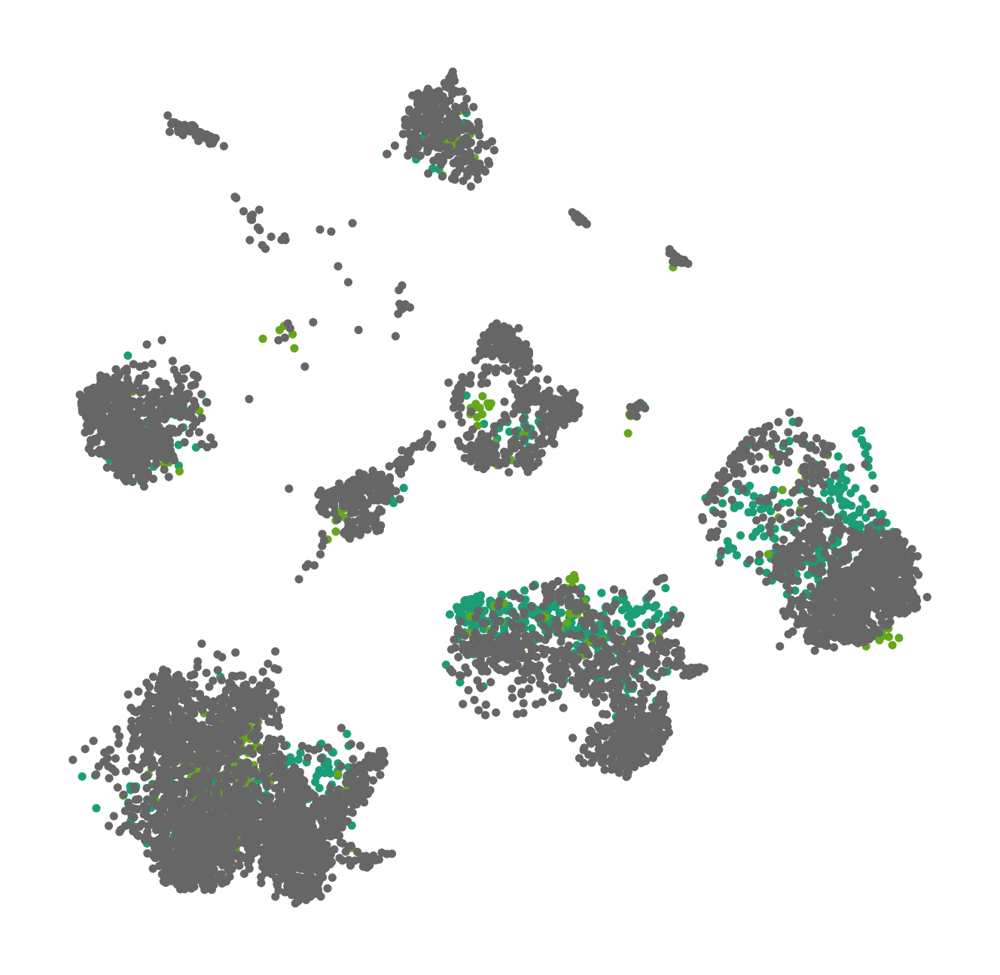

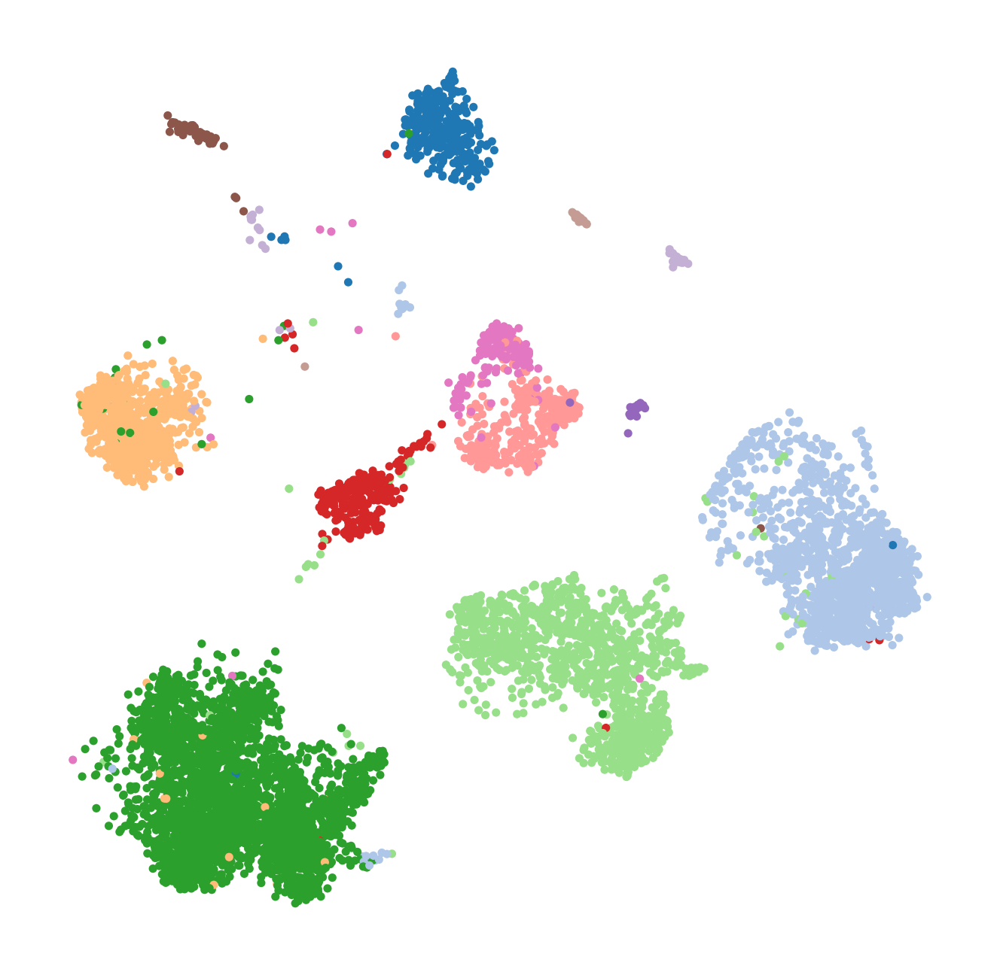

In [86]:
plot_results(
    method, "pancreas_generalization", keys=["study", "cell_type"], title="",
    legend_loc=False, batches_to_exclude=['celseq2', 'smartseq2'])

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


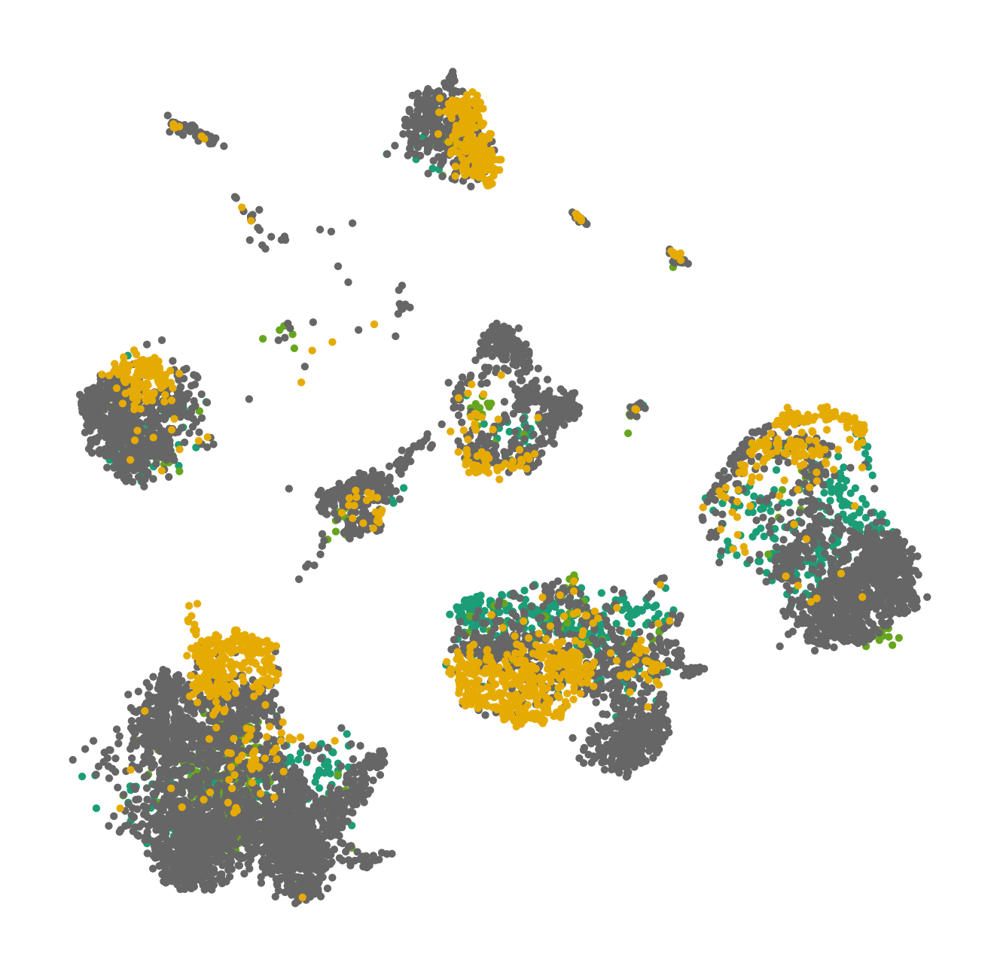

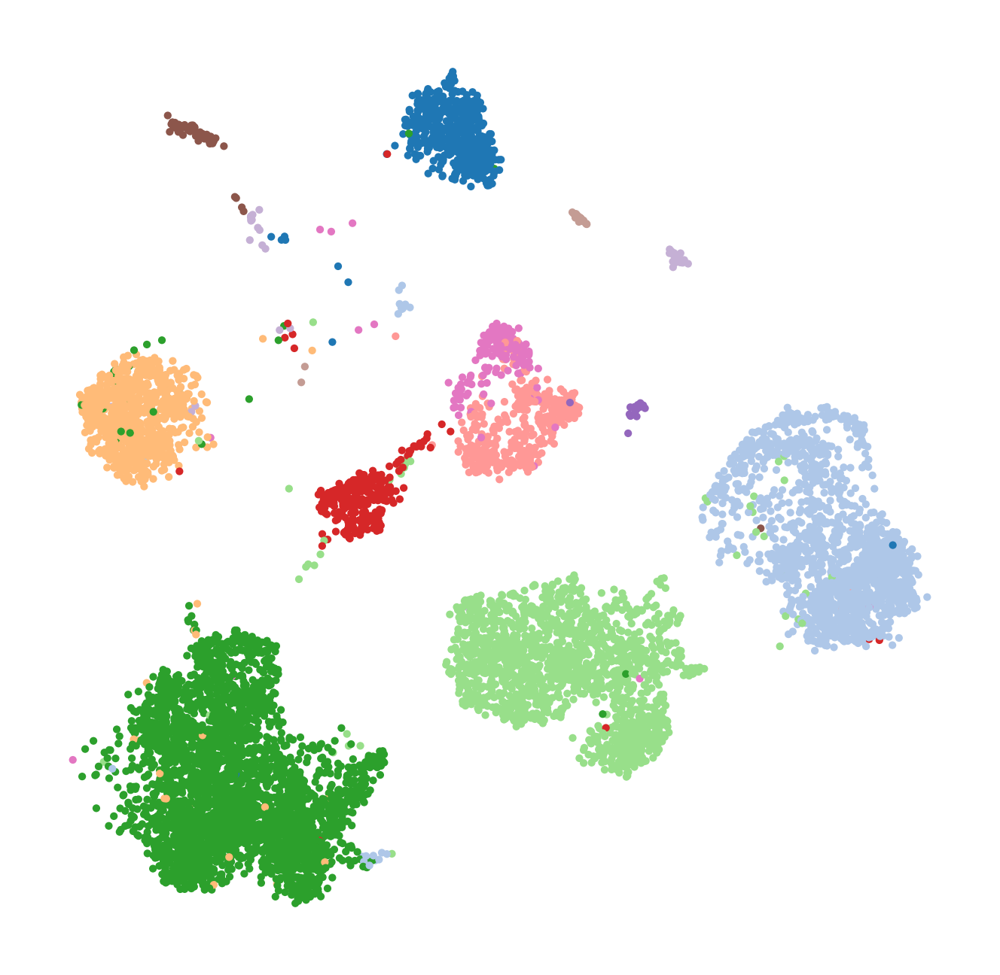

In [87]:
plot_results(
    method, "pancreas_generalization", keys=["study", "cell_type"], title="",
    legend_loc=False, batches_to_exclude=['celseq2'])

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


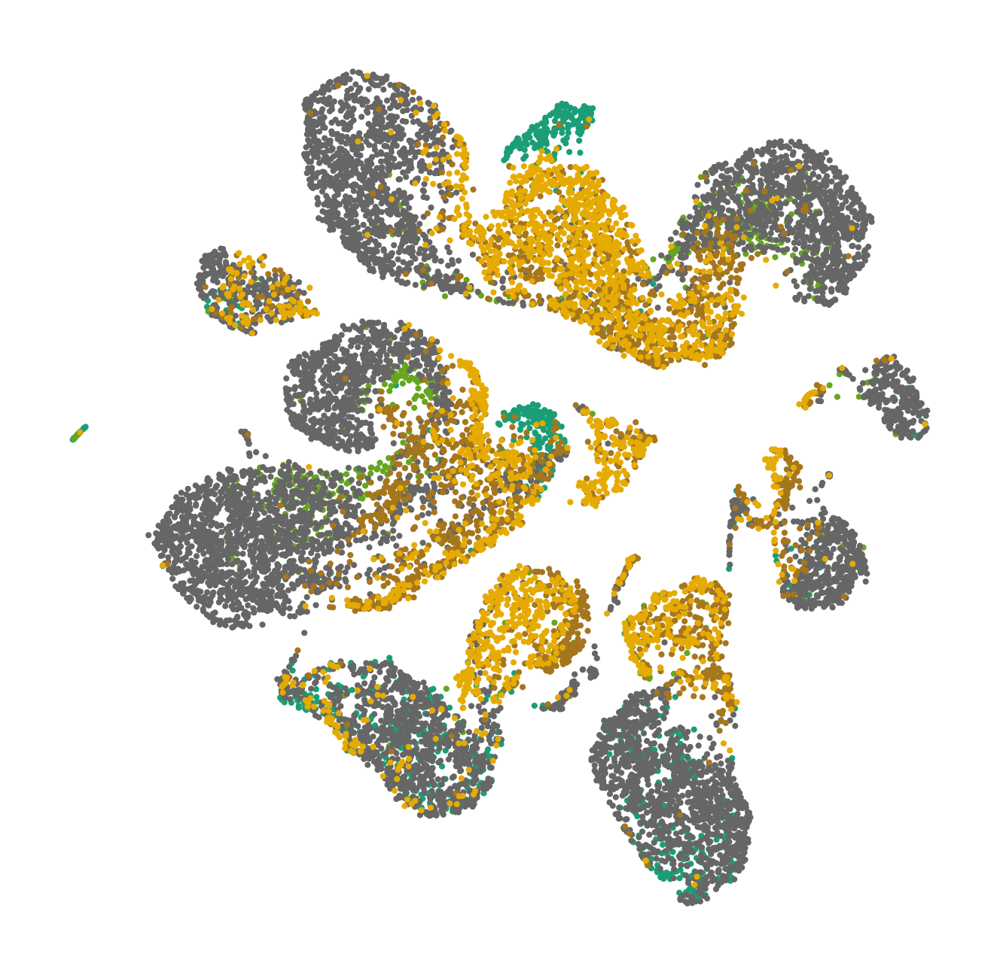

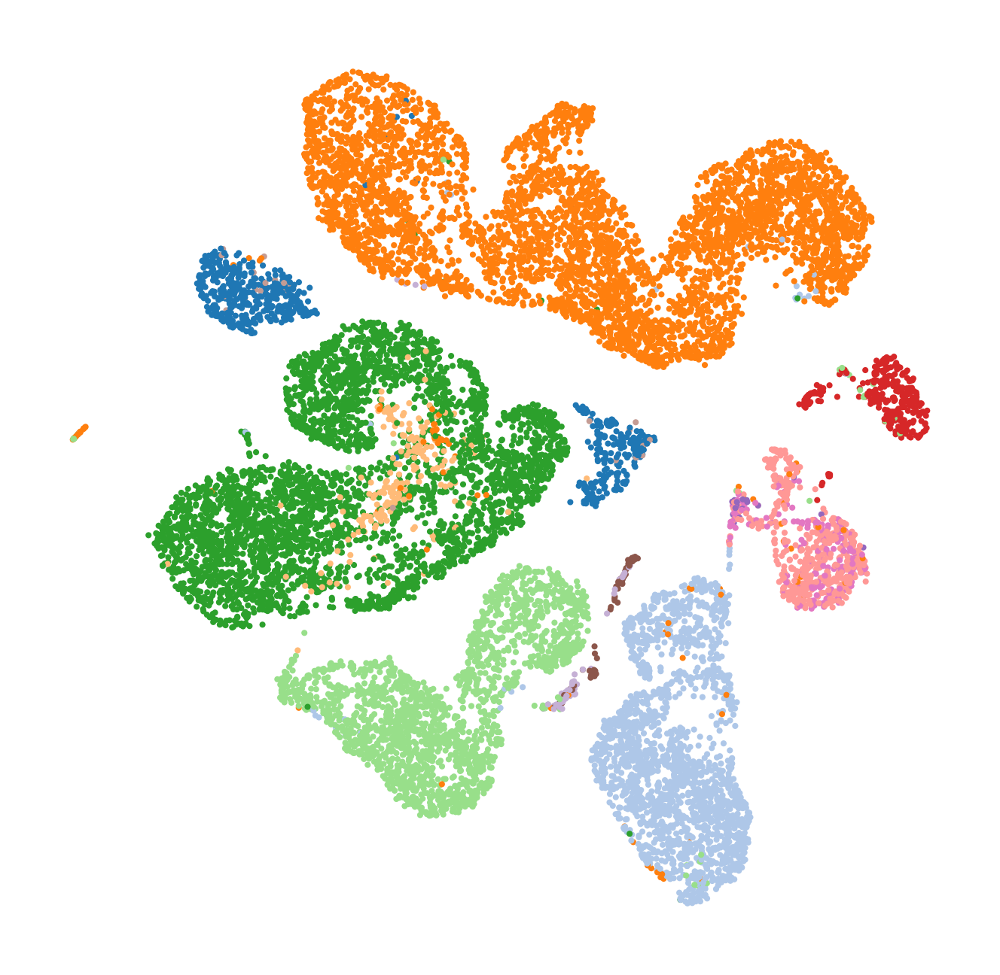

In [25]:
%matplotlib inline
plot_results(
    'desc', "pancreas_generalization", keys=["study", "cell_type"], title="", legend_loc=False, batches_to_exclude=[])

In [14]:
def plot_data(dataset, keys, title=None, frameon=False, legend_loc='right margin', batches_to_exclude = [], cells_to_exclude = []):
    set_seeds()
    sc.set_figure_params(dpi=200)
    adata = load_data(dataset, normalized=True)
    adata = load_data(dataset, normalized=True)
    adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
    adata.obs["study"] = adata.obs["study"].astype("category")

    source_adata = adata[(adata.obs["study"].isin(source_batches)) & (~(adata.obs["cell_type"].isin(cells_to_exclude)))]
        
    adata = source_adata
    
    
    
    sc.pp.neighbors(adata)
    sc.tl.umap(adata, random_state=42)

    adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
    adata.obs["study"] = adata.obs["study"].astype("category")
    adata = adata[~adata.obs["study"].isin(batches_to_exclude)]

    study_cmap_map = study_cmaps[dataset]
    cell_cmap_map = cell_type_cmaps[dataset]

    adata.uns["study_colors"] = [study_cmap_map[study] for study in adata.obs["study"].cat.categories]
    adata.uns["cell_type_colors"] = [cell_cmap_map[cell_type] for cell_type in adata.obs["cell_type"].cat.categories]

    for key in keys:
        sc.pl.umap(adata, color=key, frameon=frameon, legend_loc=legend_loc, title=title)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
2021-02-25 10:09:14 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 10:09:14 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB

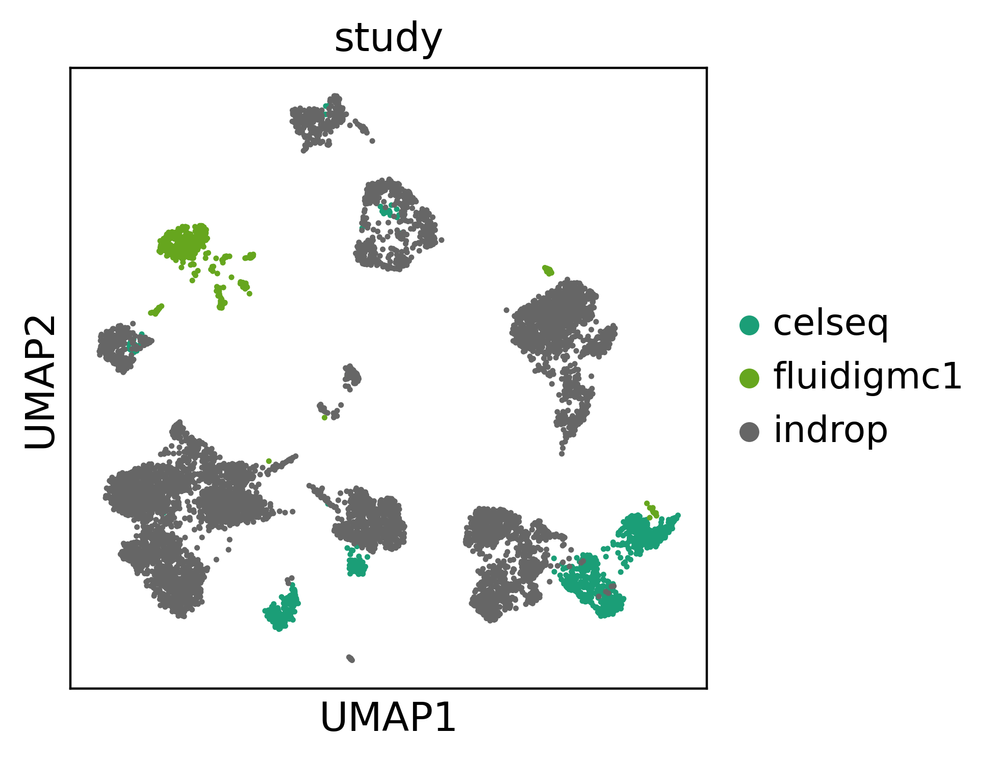

2021-02-25 10:09:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 10:09:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 10:09:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify th

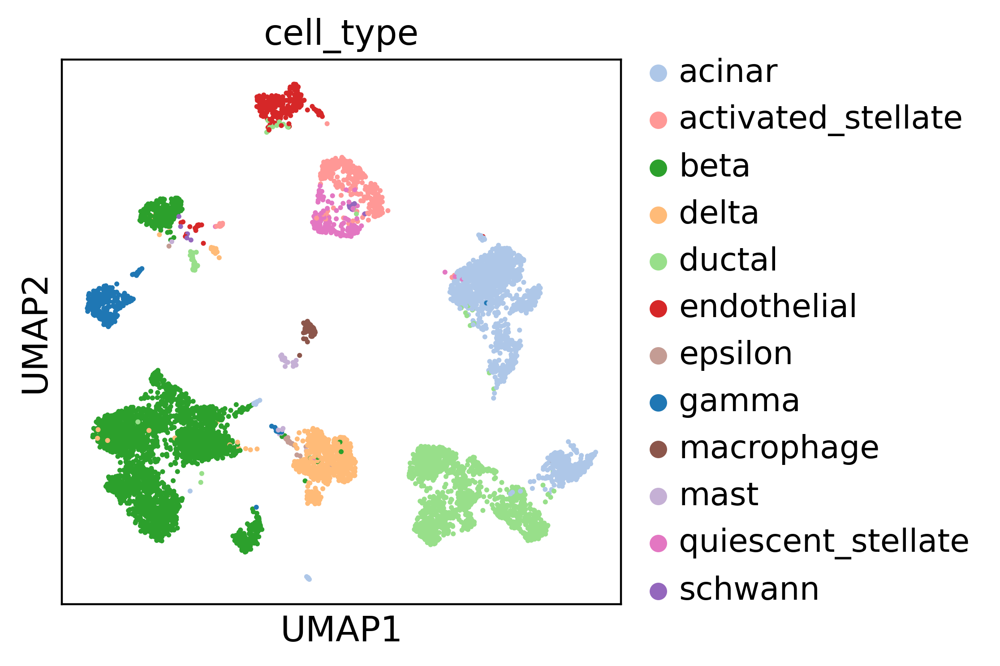

In [17]:
plot_data("pancreas_generalization", ["study", "cell_type"], title=None, frameon=True, batches_to_exclude=["celseq2", "smartseq2"], cells_to_exclude=['alpha'])

In [ ]:
results = load_results('hd-md', 'pancreas_generalization')

In [ ]:
results.obs['study']

In [2]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import adjusted_rand_score
from utils import load_results
import numpy as np
import scanpy as sc
import pandas as pd
from tqdm import tqdm

methods = ['saucie', 'desc', 'scvi', 'hd-md']
proper_names = ['SAUCIE', 'DESC', 'scVI', 'HD-AE']

batch_scores = []
target_batches = ['smartseq2', 'celseq2']
resolutions = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

for target_batch in target_batches:
    #scores = np.zeros((len(methods)*len(resolutions), 2))
    scores = np.zeros((len(resolutions), len(methods)))
    method_list = []
    for i, method in tqdm(enumerate(methods)):
        results = load_results(method, 'pancreas_generalization')
        source_results = results[(~results.obs['study'].isin(target_batches)) | (results.obs['study'] == target_batch)]
        #test_results = results[results.obs['study'] == target_batch]
        
        sc.pp.neighbors(source_results)
        
        for j, resolution in enumerate(resolutions):
            sc.tl.leiden(source_results, resolution=resolution)
            score = adjusted_rand_score(source_results.obs['leiden'], LabelEncoder().fit_transform(source_results.obs['cell_type']))
            scores[j, i] = score
        
        #for j, resolution in enumerate(resolutions):
        #    sc.tl.leiden(source_results, resolution=resolution)
        #    score = adjusted_rand_score(source_results.obs['leiden'], LabelEncoder().fit_transform(source_results.obs['cell_type']))
        #    scores[i*len(resolutions)+j, 0] = score
        #    scores[i*len(resolutions)+j, 1] = resolution
            
        method_list.extend([method] * len(resolutions))
        
        #kmeans = KMeans(
        #    n_clusters=len(source_results.obs['cell_type'].unique()),
        #    random_state=0
        #).fit(source_results.X)

        #score = adjusted_rand_score(kmeans_pred, LabelEncoder().fit_transform(test_results.obs['cell_type']))
    scores = pd.DataFrame(scores)
    #scores.columns = ['ARI', 'Resolution']
    scores.columns = methods
    #scores['Method'] = method_list
    #scores['Query Batch'] = target_batch
    batch_scores.append(scores)

0it [00:00, ?it/s]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
1it [00:05,  5.33s/it]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
2it [00:10,  5.20s/it]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
3it [00:16,  5.71s/it]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/p

In [4]:
from tqdm import tqdm
from sklearn.metrics import silhouette_samples
import scanpy as sc

silhouette_scores = []
for target_batch in target_batches:
    silhouettes_method = []
    for method in tqdm(methods):
        results = load_results(method, 'pancreas_generalization')
        source_results = results[~results.obs['study'].isin(target_batches)]
        test_results = results[results.obs['study'] == target_batch]
        
        sc.pp.neighbors(results)
        sc.tl.umap(results)
        labels = LabelEncoder().fit_transform(results.obs['cell_type'].to_numpy())
        scores = silhouette_samples(results.obsm['X_umap'], labels, n_jobs=-1)
        silhouettes_method.append(scores)
    silhouette_scores.append(silhouettes_method)

  0%|          | 0/4 [00:00<?, ?it/s]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
 25%|██▌       | 1/4 [00:12<00:36, 12.06s/it]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
 50%|█████     | 2/4 [00:25<00:25, 12.69s/it]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
 75%|████

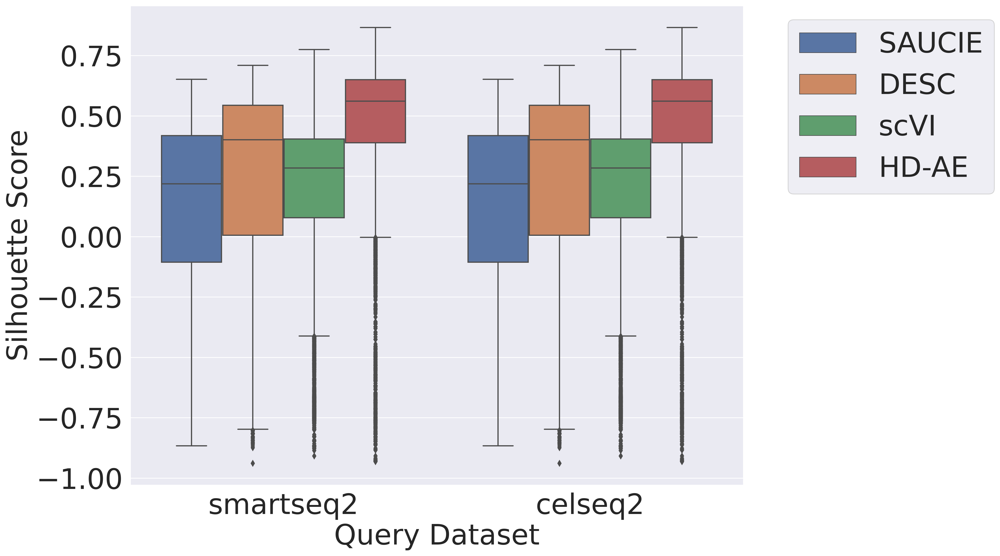

In [7]:
silhouette_df1 = pd.DataFrame({ 
    "Score":np.concatenate(silhouette_scores[0]),
    "Method": np.concatenate([np.repeat(proper_names[i], len(silhouette_scores[0][i])) for i in range(len(proper_names))]),
    "Dataset": np.repeat(target_batches[0], len(np.concatenate(silhouette_scores[0])))
})

silhouette_df2 = pd.DataFrame({ 
    "Score":np.concatenate(silhouette_scores[1]),
    "Method": np.concatenate([np.repeat(proper_names[i], len(silhouette_scores[1][i])) for i in range(len(proper_names))]),
    "Dataset": np.repeat(target_batches[1], len(np.concatenate(silhouette_scores[1])))
})

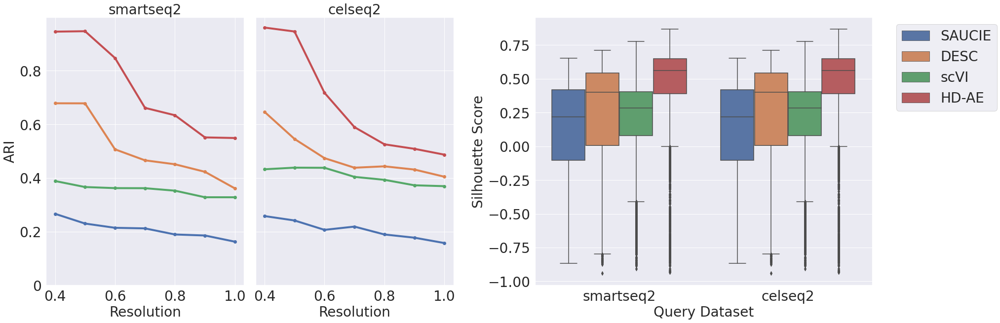

In [15]:
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
sns.set()

fontsize=28

fig = plt.figure(figsize=(30, 10))
ax1 = fig.add_subplot(1, 12, (1, 3)) 
ax2 = fig.add_subplot(1, 12, (4, 6))
ax3 = fig.add_subplot(1, 12, (8, 12))


ax1.plot(resolutions, batch_scores[0], linewidth=4, marker='o')
ax1.set_xlabel("Resolution", fontsize=fontsize)
ax1.tick_params(axis='both', which='major', labelsize=fontsize)
ax1.set_title(target_batches[0], fontsize=fontsize)
ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
ax1.set_yticklabels(["0", "0.2", "0.4", "0.6", "0.8", ""])
ax1.set_ylabel("ARI", fontsize=fontsize)
ax1.set_ylim(0, 1)

ax2.plot(resolutions, batch_scores[1], linewidth=4, marker='o')
ax2.set_xlabel("Resolution", fontsize=fontsize)
ax2.tick_params(axis='both', which='major', labelsize=fontsize)
ax2.set_title(target_batches[1], fontsize=fontsize)
ax2.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
ax2.set_yticklabels([])
ax2.set_ylim(0, 1)

ax3 = sns.boxplot(
    x="Dataset",
    y="Score",
    hue="Method",
    data=total_silhouette_df,
)

ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=fontsize)
ax3.set_ylabel("Silhouette Score", fontsize=fontsize)
ax3.set_xlabel("Query Dataset", fontsize=fontsize)
ax3.tick_params(axis='both', which='major', labelsize=fontsize)

In [ ]:
ebms_pancreas = [ebm(x, "pancreas_generalization", excluded_cells=["alpha"]) for x in tqdm(methods)]
purities_pancreas = [knn_purity(x, "pancreas_generalization", "study", target_batch="smartseq2", excluded_cells=["alpha"]) for x in tqdm(methods)]

In [ ]:
ebms_pbmc = [ebm(x, "pbmc_generalization", excluded_cells=["B cell", "Unassigned"]) for x in tqdm(methods)]
purities_pbmc = [knn_purity(x, "pbmc_generalization", "study", target_batch="Drop-seq", excluded_cells=["B cell", "Unassigned"]) for x in tqdm(methods)]

In [ ]:
proper_names = ["scVI", "DESC", "HD-MD"]

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

%matplotlib inline

silhouette_pbmc_df = pd.DataFrame({ 
    "Score":np.concatenate(silhouettes_pbmc),
    "Method": np.concatenate([np.repeat(proper_names[i], len(silhouettes_pbmc[i])) for i in range(len(proper_names))]),
    "Dataset": np.repeat("Pancreas", len(np.concatenate(silhouettes_pbmc)))
})

ax = sns.boxplot(data=silhouette_pbmc_df, x="Dataset", y="Score", hue="Method", order=["Pancreas"])
plt.show()

In [ ]:
silhouettes_pancreas = [silhouette(x, "pancreas_generalization") for x in tqdm(methods)]

In [ ]:
silhouette_pancreas_df = pd.DataFrame({ 
    "Score":np.concatenate(silhouettes_pancreas),
    "Method": np.concatenate([np.repeat(proper_names[i], len(silhouettes_pancreas[i])) for i in range(len(proper_names))]),
    "Dataset": np.repeat("Pancreas", len(np.concatenate(silhouettes_pancreas)))
})

In [ ]:
total_silhouette_df = pd.concat([silhouette_pancreas_df, silhouette_pbmc_df])

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

%matplotlib inline

fontsize=36

sns.set()
plt.figure(figsize=(21,8), dpi=300)

palette = {
    "scVI": sns.color_palette()[4], #Brown
    "DESC": sns.color_palette()[5], #Purple
    "HD-MD": sns.color_palette()[6]
}

ax = sns.boxplot(data=total_silhouette_df, x="Dataset", y="Score", hue="Method", palette=palette, order=["Pancreas", "PBMC"])
ax.set_ylabel("Silhouette Score", fontsize=fontsize)
ax.yaxis.set_tick_params(labelsize=fontsize)
ax.xaxis.set_tick_params(labelsize=fontsize)
ax.set_xlabel("")
ax.set_xlim(-0.5, 1.5)
ax.set_ylim(-1.4, 1.4)
ax.set_yticks([-1.0, -0.5, 0, 0.5, 1.0])
plt.tight_layout()

f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
colors = sns.color_palette()[4:]
handles = [f("s", colors[i]) for i in range(len(colors))]
legend = plt.legend(
    handles=handles,
    labels=proper_names,
    loc='upper center',
    fontsize=fontsize,
    markerscale=4,
    ncol=3,
    bbox_to_anchor=(0.5, 1.025)
)

In [ ]:
"""
f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
colors = [sns.color_palette()[i] for i in [4,5,6]]
handles = [f("s", colors[i]) for i in range(len(colors))]
legend = plt.legend(
    handles=handles,
    labels=proper_names,
    loc='center',
    fontsize=fontsize,
    handlelength=2,
    handleheight=2,
    markerscale=4
)
plt.gca().set_axis_off()
plt.show()
"""

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler

purities_pancreas_standardized = scaler().fit_transform(np.array(purities_pancreas).reshape(-1, 1)).reshape(-1)
ebms_pancreas_standardized = scaler().fit_transform(np.array(ebms_pancreas).reshape(-1, 1)).reshape(-1)

purities_pbmc_standardized = scaler().fit_transform(np.array(purities_pbmc).reshape(-1, 1)).reshape(-1)
ebms_pbmc_standardized = scaler().fit_transform(np.array(ebms_pbmc).reshape(-1, 1)).reshape(-1)

In [ ]:
sns.set()

fontsize=38
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,9), dpi=300)

# set width of bar
barWidth = 0.15
 
# set height of bar
bars1 = purities_pancreas_standardized
bars2 = ebms_pancreas_standardized
bars3 = [x+y for (x, y) in zip(ebms_pancreas_standardized, purities_pancreas_standardized)]
 
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

hatches = ['', '\\', 'o']
 
# Make the plot
ax1.bar(r1, bars1, color=list(sns.color_palette())[4:], width=barWidth, edgecolor='white', label='KNN Purity', hatch=hatches[0])
ax1.bar(r2, bars2, color=list(sns.color_palette()[4:]), width=barWidth, edgecolor='white', label='EBM', hatch=hatches[1])
ax1.bar(r3, bars3, color=list(sns.color_palette()[4:]), width=barWidth, edgecolor='white', label='Purity+EBM', hatch=hatches[2])


# Add xticks on the middle of the group bars
ax1.set_xticks([r + barWidth for r in range(len(bars1))])
ax1.set_xticklabels(proper_names, fontsize=fontsize)
ax1.set_xlabel("Pancreas", fontsize=fontsize)
ax1.set_ylim(0, 2.1)

ax1.yaxis.set_tick_params(labelsize=fontsize)
#ax1.set_ylabel("Value", fontsize=fontsize, labelpad=10)

# Create legend & Show graphic

# set height of bar
bars1 = purities_pbmc_standardized
bars2 = ebms_pbmc_standardized
bars3 = [x+y for (x, y) in zip(ebms_pbmc_standardized, purities_pbmc_standardized)]
 
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
 
# Make the plot
ax2.bar(r1, bars1, color=list(sns.color_palette())[4:], width=barWidth, edgecolor='white', label='KNN Purity', hatch=hatches[0])
ax2.bar(r2, bars2, color=list(sns.color_palette())[4:], width=barWidth, edgecolor='white', label='EBM', hatch=hatches[1])
ax2.bar(r3, bars3, color=list(sns.color_palette())[4:], width=barWidth, edgecolor='white', label='Purity+EBM', hatch=hatches[2])
 
# Add xticks on the middle of the group bars
ax2.set_xticks([r + barWidth for r in range(len(bars1))])
ax2.set_xticklabels(proper_names, fontsize=fontsize)

ax2.yaxis.set_tick_params(labelsize=fontsize)
ax2.set_xlabel("PBMC", fontsize=fontsize)
ax2.set_ylim(0, 2.1)
ax2.set_yticklabels([])

"""
patches = [
    Patch(
        edgecolor=[1,1,1],
        facecolor=[0, 0, 0],
        label=metric_labels[i],
        hatch=hatches[i]) for i in range(len(hatches))
]

labels = colors
plt.legend(
    handles=patches,
    loc='center',
    fontsize=fontsize,
    handlelength=2,
    handleheight=2,
    bbox_to_anchor=(1, 0.5)
)
"""

from matplotlib.patches import Patch
metric_labels = ["KNN Purity", "EBM", "Purity+EBM"]
patches = [Patch(edgecolor=[1,1,1], facecolor=[0, 0, 0], label=metric_labels[i], hatch=hatches[i]) for i in range(len(hatches))]
 
# Create legend & Show graphic
plt.legend(handles=patches, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=fontsize, handlelength=1.5, handleheight=1.5)
#ax1.legend(handles=patches, loc='upper left', fontsize=fontsize, handlelength=1, handleheight=1)


plt.tight_layout()
plt.show()

In [ ]:
for i, method in enumerate(methods):
    plot_results(method, "pancreas_generalization", keys=["study", "cell_type"], title="", legend_loc=False)

In [ ]:
results = load_results("hd-md", "pancreas_generalization")
print("loaded results")
excluded_cells = ["gamma"]
target_batches = ["smartseq2"]
#excluded_cells = ["B cell", "CD16+ monocyte"]
#target_batches = ["Drop-seq", "10x Chromium (v3)"]


source_results = results[~results.obs["study"].isin(target_batches)]
target_results = results[results.obs["study"].isin(target_batches)]
source_results = source_results[~source_results.obs["cell_type"].isin(excluded_cells)]
query_results = target_results[target_results.obs["study"].isin(["Drop-seq", "10x Chromium (v3)"])]

... storing 'cell_type' as categorical
... storing 'study' as categorical


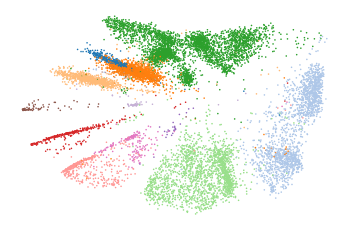

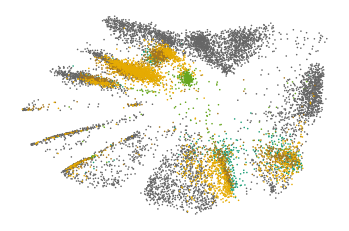

In [7]:
import SAUCIE
from utils import load_data
import tensorflow as tf
import numpy as np
from anndata import AnnData
import scanpy as sc
dataset = 'pancreas_generalization'
adata = load_data(dataset, normalized=True)

source_batches = ["celseq", "indrop", "fluidigmc1"]
excluded_cells = ["alpha"]
source_adata = adata[adata.obs["study"].isin(source_batches)]
source_adata = source_adata[~source_adata.obs["cell_type"].isin(excluded_cells)]
target_adata = adata[~adata.obs["study"].isin(source_batches)]
query_adata = target_adata[target_adata.obs["study"].isin(["smartseq2", 'celseq2'])]

tf.reset_default_graph()
saucie = SAUCIE.SAUCIE(source_adata.shape[1])
loadtrain = SAUCIE.Loader(source_adata.X, shuffle=True)
saucie.train(loadtrain, steps=1000)

loadeval = SAUCIE.Loader(np.concatenate([source_adata.X, target_adata.X]), shuffle=False)
embedding = saucie.get_embedding(loadeval)

eval_adata = AnnData.concatenate(source_adata, target_adata)
saucie_results = AnnData(
    X = embedding,
    obs={
        "cell_type": eval_adata.obs['cell_type'].values,
        "study": eval_adata.obs['study'].values
    }
)
saucie_results.write("results/{}/saucie.h5ad".format(dataset))

import matplotlib.pyplot as plt
saucie_results.obsm['X_umap'] = embedding

study_cmap_map = study_cmaps[dataset]
cell_cmap_map = cell_type_cmaps[dataset]

saucie_results.uns["study_colors"] = [study_cmap_map[study] for study in saucie_results.obs["study"].cat.categories]
saucie_results.uns["cell_type_colors"] = [cell_cmap_map[cell_type] for cell_type in saucie_results.obs["cell_type"].cat.categories]

sc.pl.umap(saucie_results, color='cell_type', title="", legend_loc=False, frameon=False)
sc.pl.umap(saucie_results, color='study', title="", legend_loc=False, frameon=False)

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


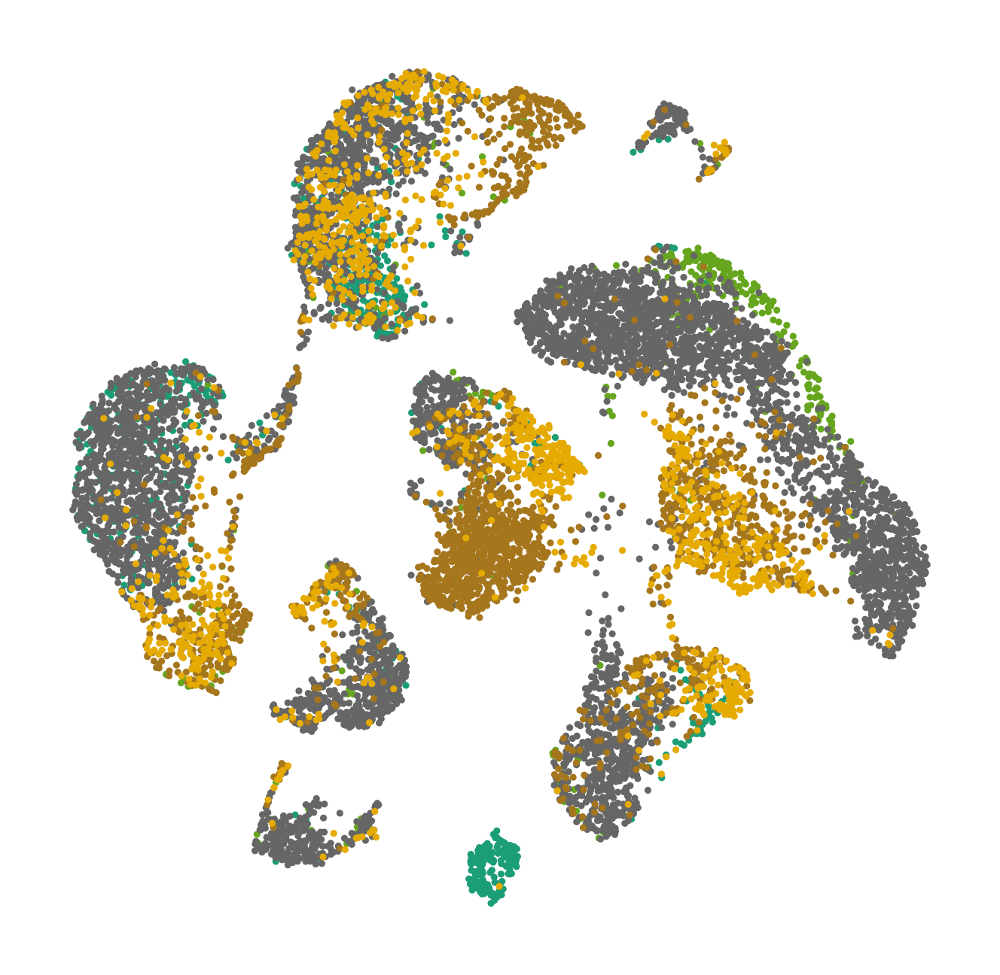

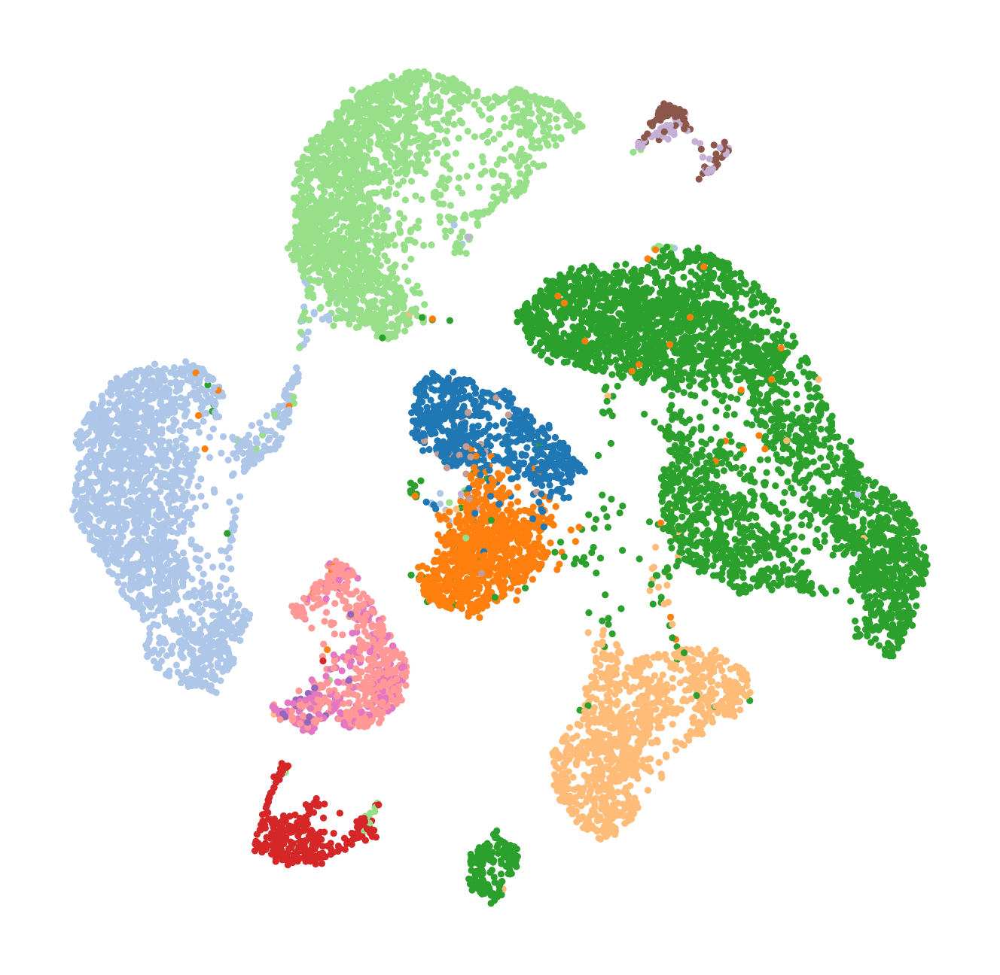

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


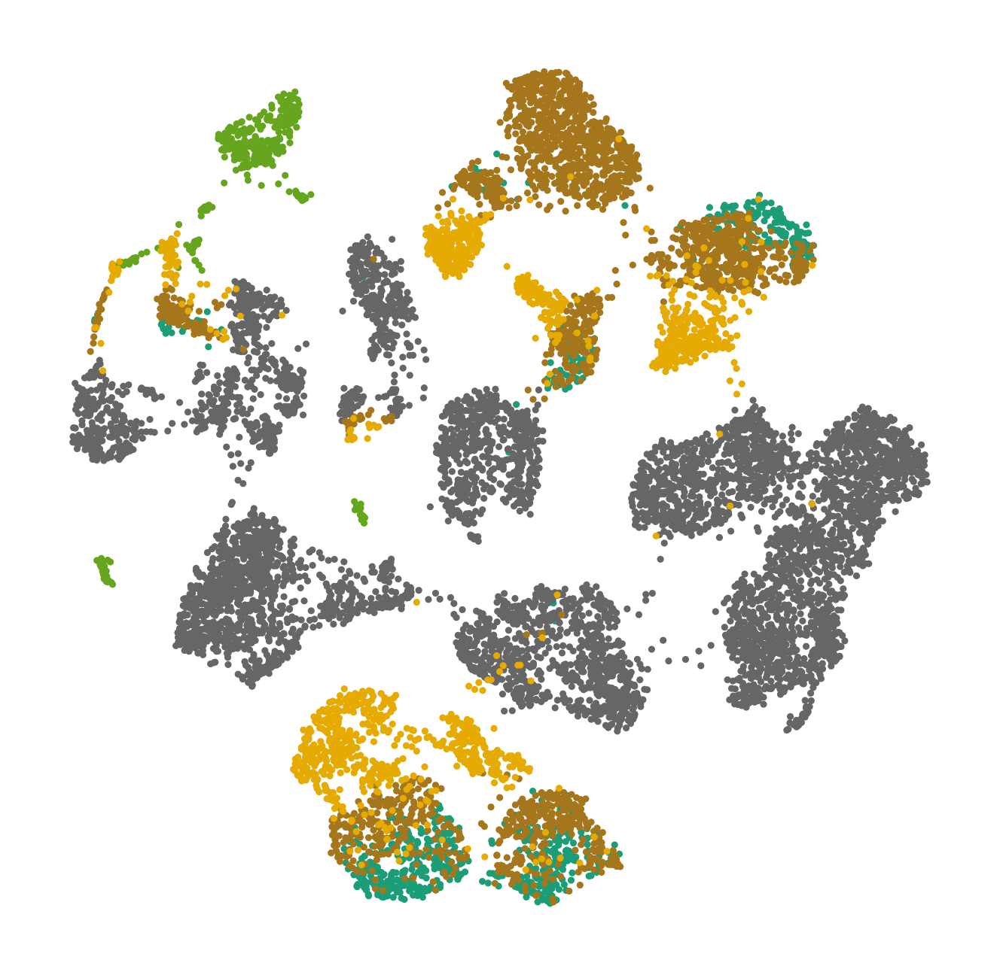

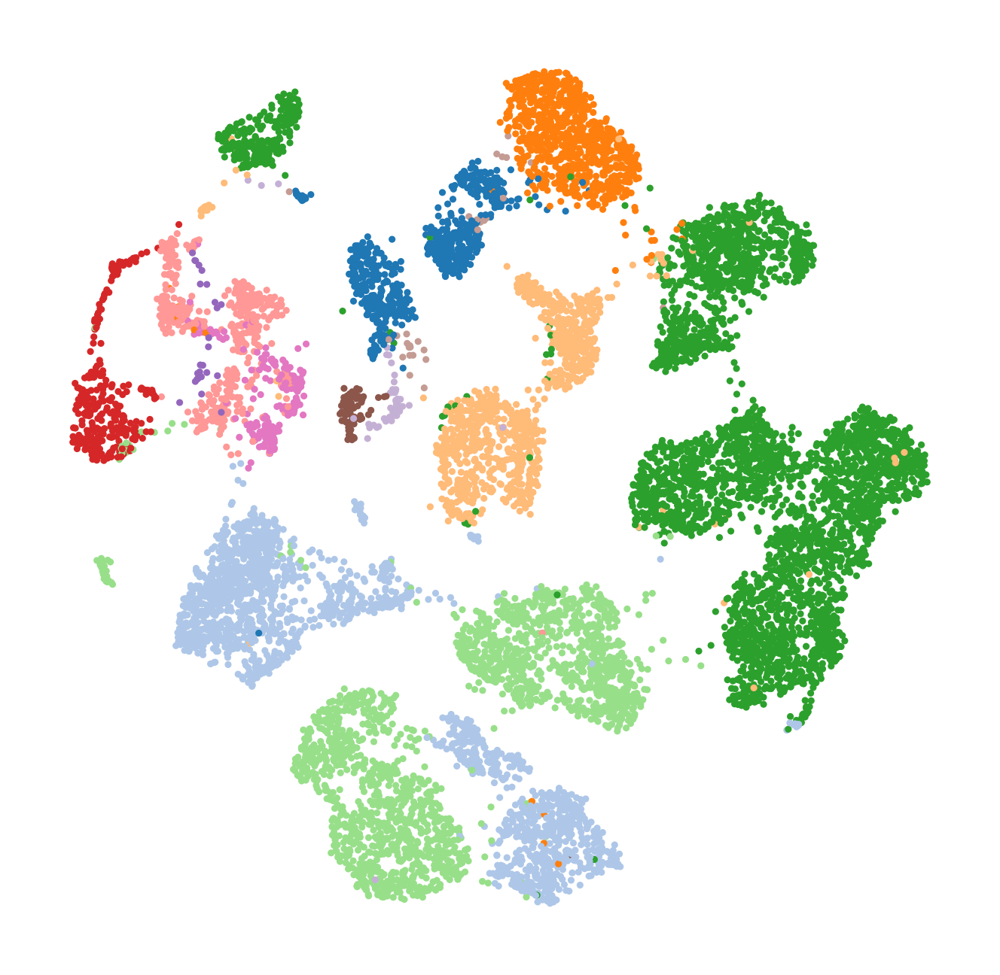

In [99]:
for method in ['desc', 'scvi']:
    plot_results(method, "pancreas_generalization", keys=["study", "cell_type"], title="", legend_loc=False)

2021-02-18 14:57:01 INFO     Epoch 5 of 100, Train Loss: 0.105
2021-02-18 14:57:01 INFO     Reconstruction loss, hsic: 0.100996, 0.002630
2021-02-18 14:57:06 INFO     Epoch 10 of 100, Train Loss: 0.094
2021-02-18 14:57:06 INFO     Reconstruction loss, hsic: 0.089957, 0.003497
2021-02-18 14:57:11 INFO     Epoch 15 of 100, Train Loss: 0.089
2021-02-18 14:57:11 INFO     Reconstruction loss, hsic: 0.089204, 0.003143
2021-02-18 14:57:16 INFO     Epoch 20 of 100, Train Loss: 0.085
2021-02-18 14:57:16 INFO     Reconstruction loss, hsic: 0.087196, 0.002677
2021-02-18 14:57:22 INFO     Epoch 25 of 100, Train Loss: 0.082
2021-02-18 14:57:22 INFO     Reconstruction loss, hsic: 0.083297, 0.001761
2021-02-18 14:57:27 INFO     Epoch 30 of 100, Train Loss: 0.080
2021-02-18 14:57:27 INFO     Reconstruction loss, hsic: 0.076756, 0.002681
2021-02-18 14:57:32 INFO     Epoch 35 of 100, Train Loss: 0.079
2021-02-18 14:57:32 INFO     Reconstruction loss, hsic: 0.074725, 0.002155
2021-02-18 14:57:38 INFO    

105.68648481369019 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


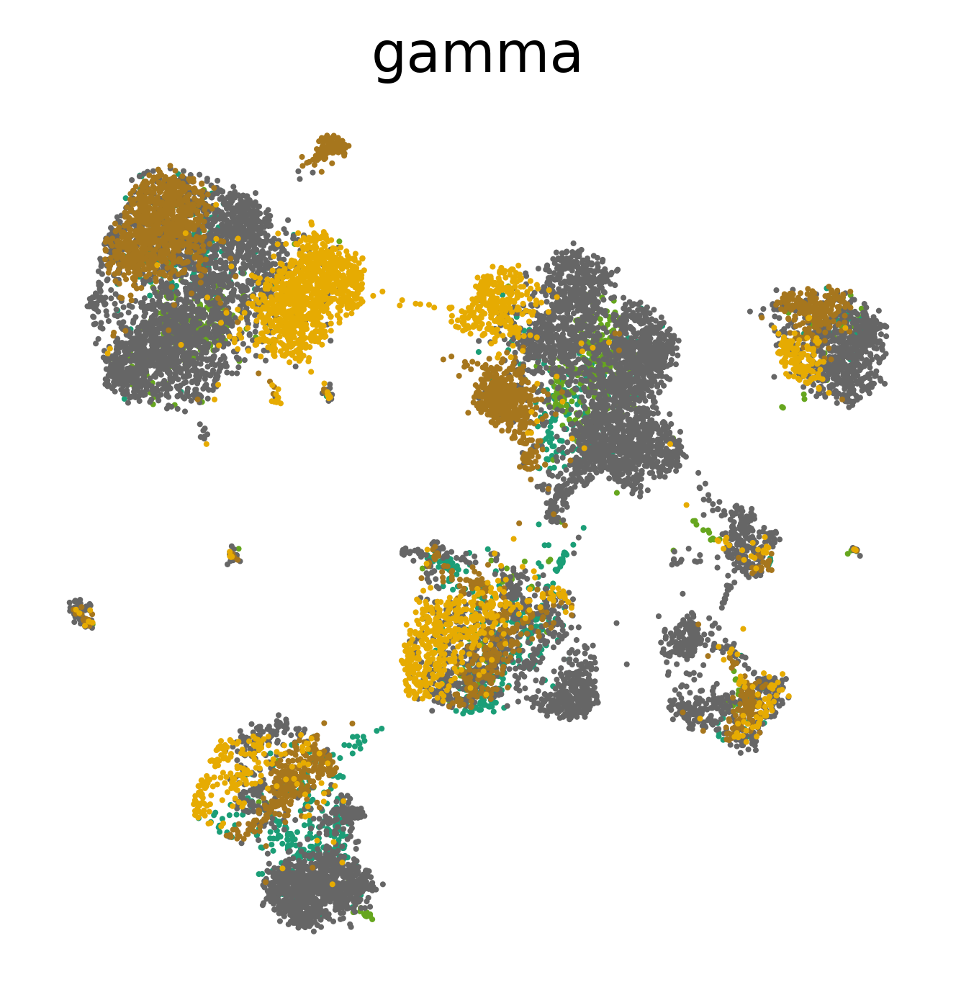

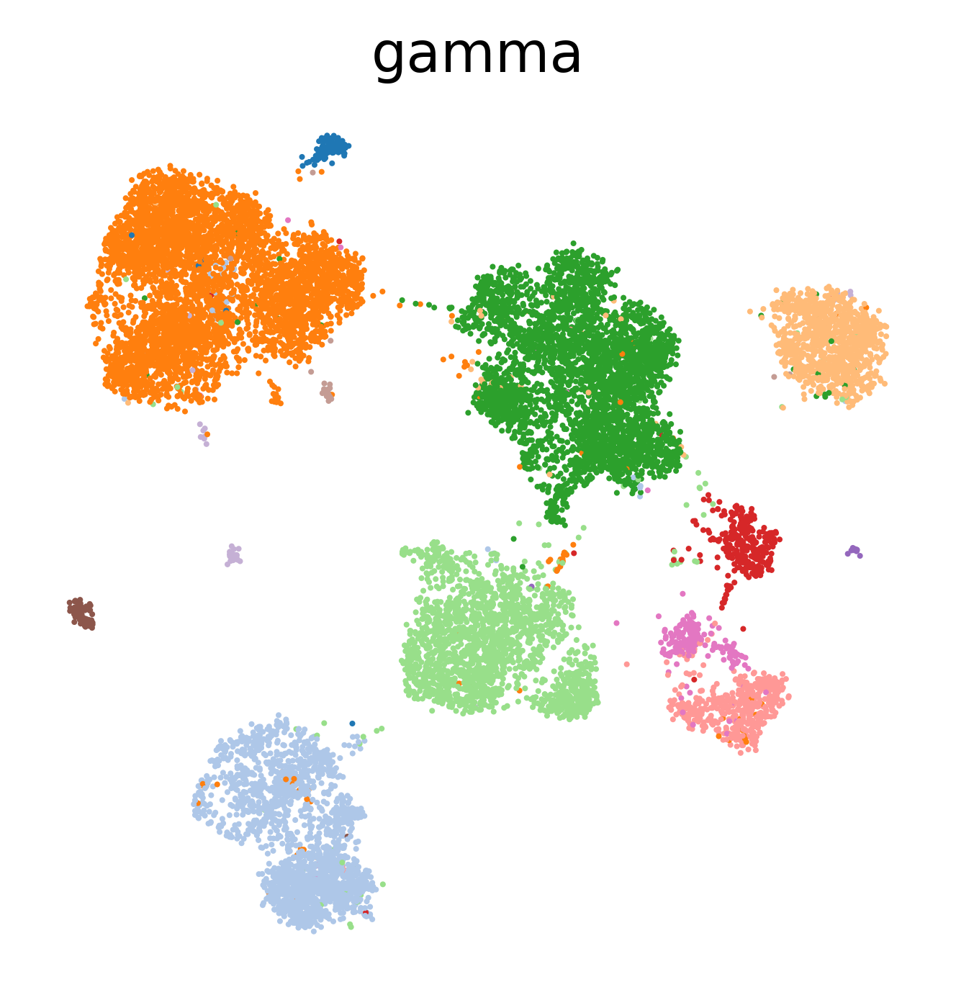

2021-02-18 14:58:57 INFO     Epoch 5 of 100, Train Loss: 0.106
2021-02-18 14:58:57 INFO     Reconstruction loss, hsic: 0.105141, 0.001190
2021-02-18 14:59:01 INFO     Epoch 10 of 100, Train Loss: 0.095
2021-02-18 14:59:01 INFO     Reconstruction loss, hsic: 0.091950, 0.001353
2021-02-18 14:59:06 INFO     Epoch 15 of 100, Train Loss: 0.089
2021-02-18 14:59:06 INFO     Reconstruction loss, hsic: 0.082470, 0.001565
2021-02-18 14:59:11 INFO     Epoch 20 of 100, Train Loss: 0.086
2021-02-18 14:59:11 INFO     Reconstruction loss, hsic: 0.086977, 0.001209
2021-02-18 14:59:15 INFO     Epoch 25 of 100, Train Loss: 0.083
2021-02-18 14:59:15 INFO     Reconstruction loss, hsic: 0.079735, 0.001523
2021-02-18 14:59:20 INFO     Epoch 30 of 100, Train Loss: 0.081
2021-02-18 14:59:20 INFO     Reconstruction loss, hsic: 0.077749, 0.001114
2021-02-18 14:59:25 INFO     Epoch 35 of 100, Train Loss: 0.079
2021-02-18 14:59:25 INFO     Reconstruction loss, hsic: 0.084518, 0.001224
2021-02-18 14:59:29 INFO    

93.37948513031006 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


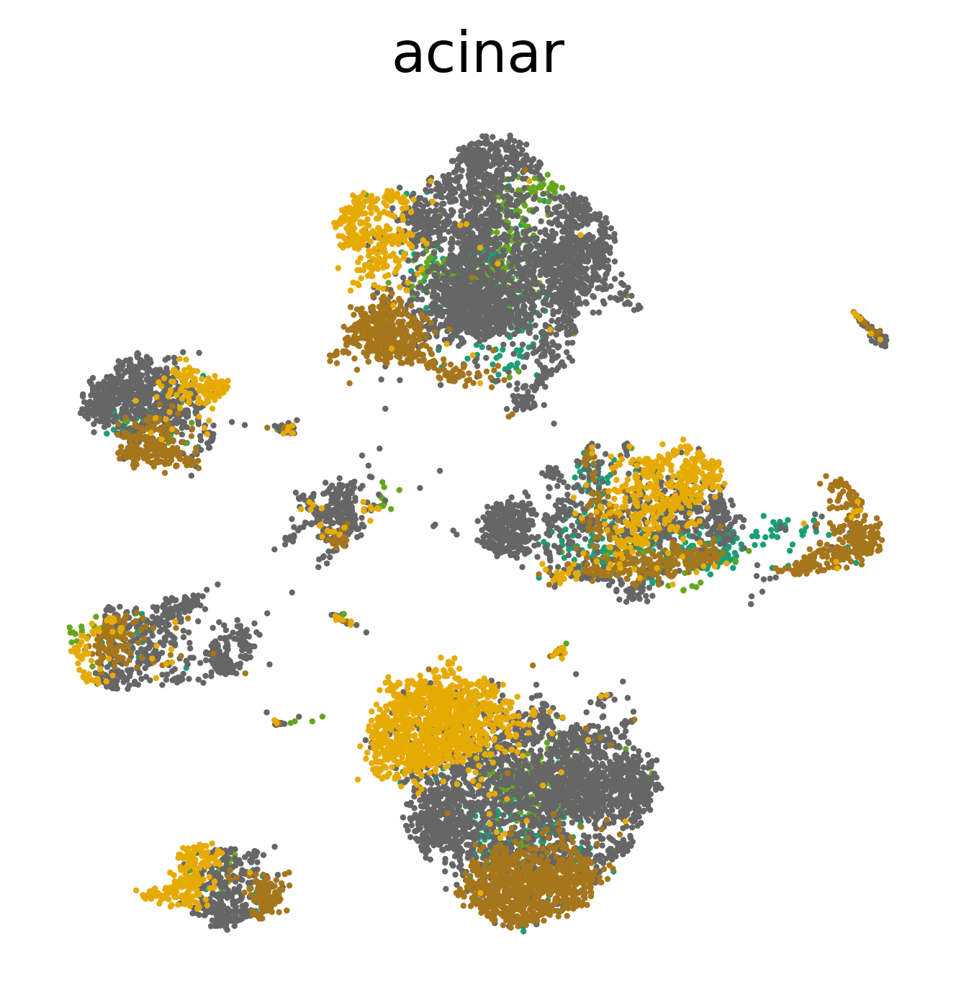

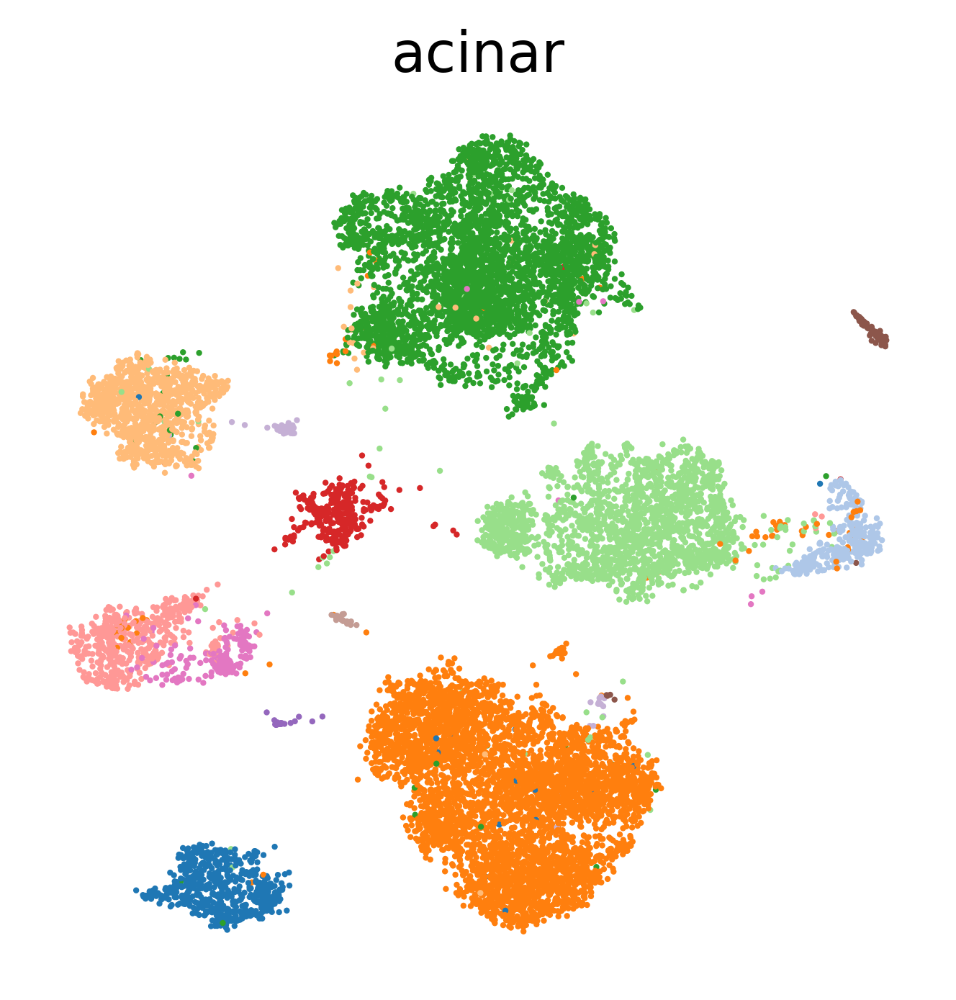

2021-02-18 15:00:40 INFO     Epoch 5 of 100, Train Loss: 0.114
2021-02-18 15:00:40 INFO     Reconstruction loss, hsic: 0.095447, 0.009567
2021-02-18 15:00:44 INFO     Epoch 10 of 100, Train Loss: 0.103
2021-02-18 15:00:44 INFO     Reconstruction loss, hsic: 0.086728, 0.008389
2021-02-18 15:00:48 INFO     Epoch 15 of 100, Train Loss: 0.096
2021-02-18 15:00:48 INFO     Reconstruction loss, hsic: 0.071186, 0.009494
2021-02-18 15:00:52 INFO     Epoch 20 of 100, Train Loss: 0.092
2021-02-18 15:00:52 INFO     Reconstruction loss, hsic: 0.089989, 0.008312
2021-02-18 15:00:56 INFO     Epoch 25 of 100, Train Loss: 0.089
2021-02-18 15:00:56 INFO     Reconstruction loss, hsic: 0.090159, 0.010304
2021-02-18 15:01:00 INFO     Epoch 30 of 100, Train Loss: 0.086
2021-02-18 15:01:00 INFO     Reconstruction loss, hsic: 0.085151, 0.005711
2021-02-18 15:01:04 INFO     Epoch 35 of 100, Train Loss: 0.084
2021-02-18 15:01:04 INFO     Reconstruction loss, hsic: 0.089910, 0.004730
2021-02-18 15:01:08 INFO    

79.38486957550049 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


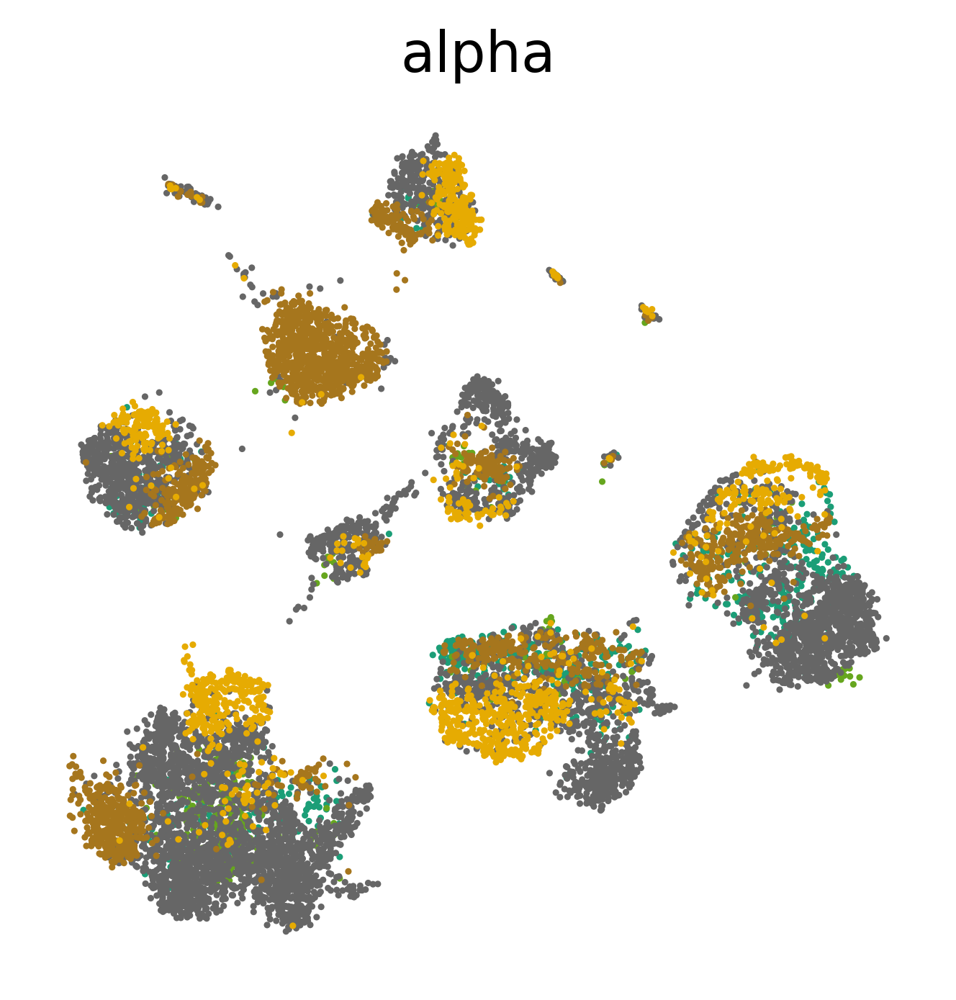

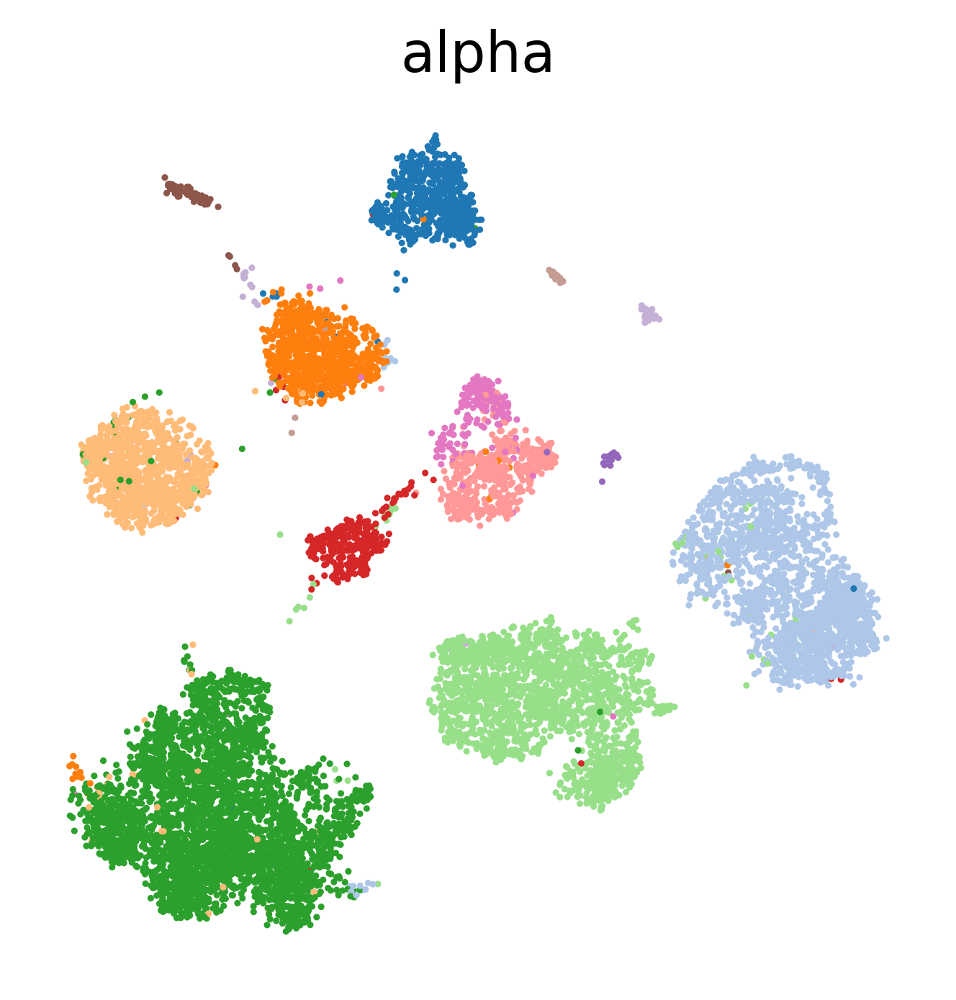

2021-02-18 15:02:10 INFO     Epoch 5 of 100, Train Loss: 0.107
2021-02-18 15:02:10 INFO     Reconstruction loss, hsic: 0.107626, 0.002764
2021-02-18 15:02:15 INFO     Epoch 10 of 100, Train Loss: 0.096
2021-02-18 15:02:15 INFO     Reconstruction loss, hsic: 0.094547, 0.002381
2021-02-18 15:02:20 INFO     Epoch 15 of 100, Train Loss: 0.090
2021-02-18 15:02:20 INFO     Reconstruction loss, hsic: 0.078104, 0.003257
2021-02-18 15:02:25 INFO     Epoch 20 of 100, Train Loss: 0.086
2021-02-18 15:02:25 INFO     Reconstruction loss, hsic: 0.082875, 0.003121
2021-02-18 15:02:30 INFO     Epoch 25 of 100, Train Loss: 0.083
2021-02-18 15:02:30 INFO     Reconstruction loss, hsic: 0.081781, 0.002710
2021-02-18 15:02:35 INFO     Epoch 30 of 100, Train Loss: 0.081
2021-02-18 15:02:35 INFO     Reconstruction loss, hsic: 0.087592, 0.002469
2021-02-18 15:02:40 INFO     Epoch 35 of 100, Train Loss: 0.080
2021-02-18 15:02:40 INFO     Reconstruction loss, hsic: 0.075399, 0.000834
2021-02-18 15:02:45 INFO    

101.92645215988159 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


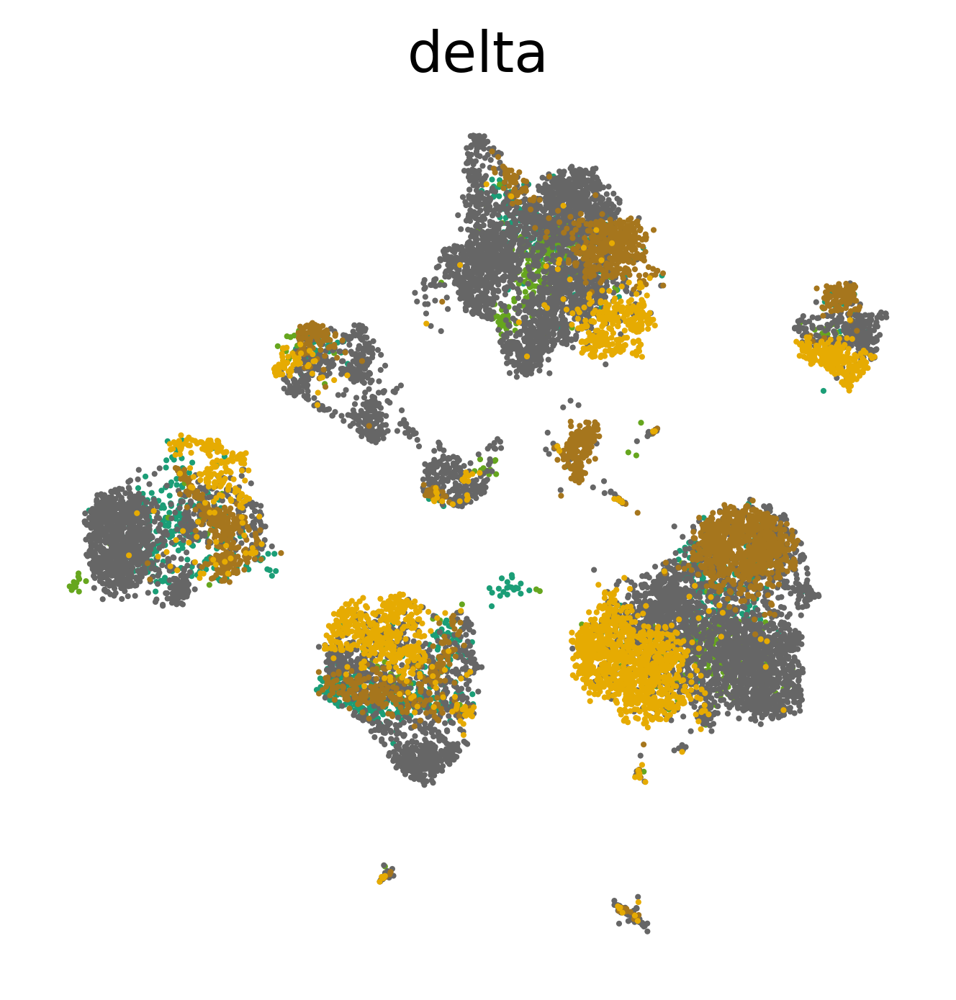

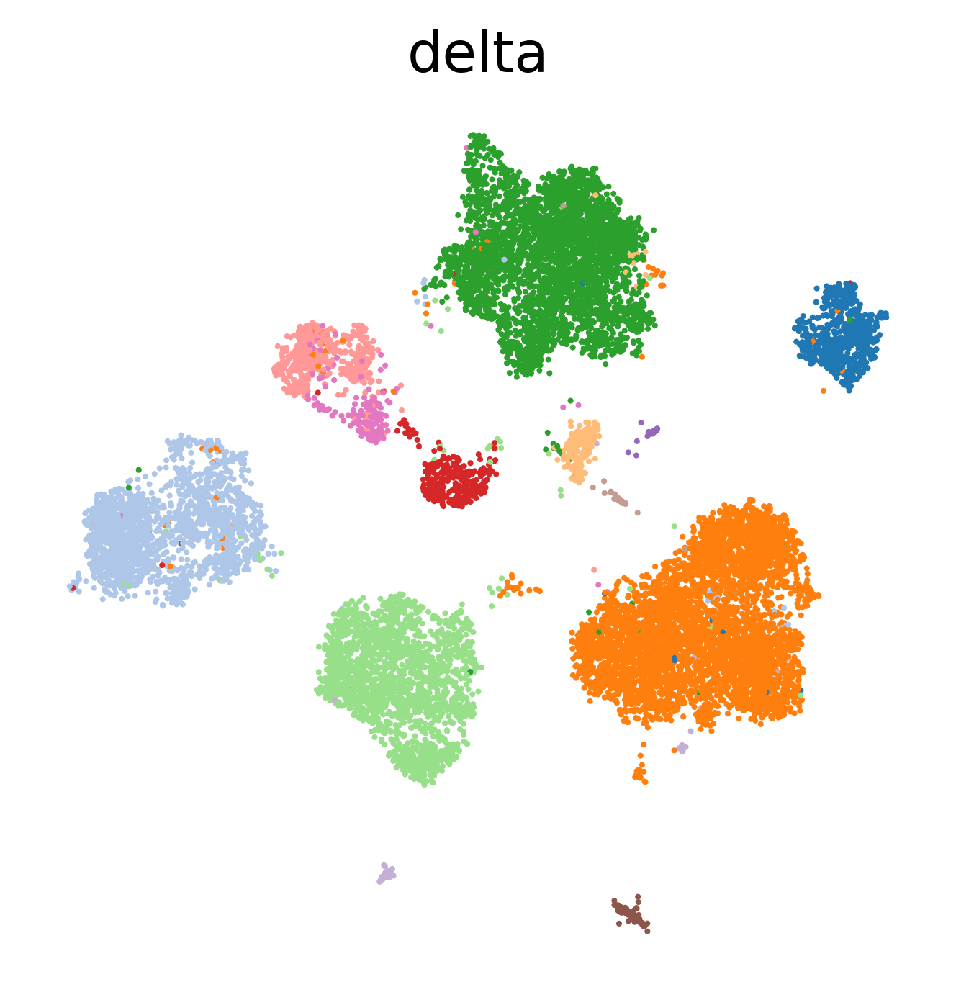

2021-02-18 15:04:02 INFO     Epoch 5 of 100, Train Loss: 0.118
2021-02-18 15:04:02 INFO     Reconstruction loss, hsic: 0.116653, 0.001315
2021-02-18 15:04:05 INFO     Epoch 10 of 100, Train Loss: 0.106
2021-02-18 15:04:05 INFO     Reconstruction loss, hsic: 0.108432, 0.001459
2021-02-18 15:04:09 INFO     Epoch 15 of 100, Train Loss: 0.100
2021-02-18 15:04:09 INFO     Reconstruction loss, hsic: 0.095073, 0.001388
2021-02-18 15:04:13 INFO     Epoch 20 of 100, Train Loss: 0.096
2021-02-18 15:04:13 INFO     Reconstruction loss, hsic: 0.089671, 0.001909
2021-02-18 15:04:17 INFO     Epoch 25 of 100, Train Loss: 0.092
2021-02-18 15:04:17 INFO     Reconstruction loss, hsic: 0.091940, 0.001434
2021-02-18 15:04:21 INFO     Epoch 30 of 100, Train Loss: 0.089
2021-02-18 15:04:21 INFO     Reconstruction loss, hsic: 0.088572, 0.001071
2021-02-18 15:04:25 INFO     Epoch 35 of 100, Train Loss: 0.087
2021-02-18 15:04:25 INFO     Reconstruction loss, hsic: 0.085329, 0.001054
2021-02-18 15:04:29 INFO    

77.59536123275757 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


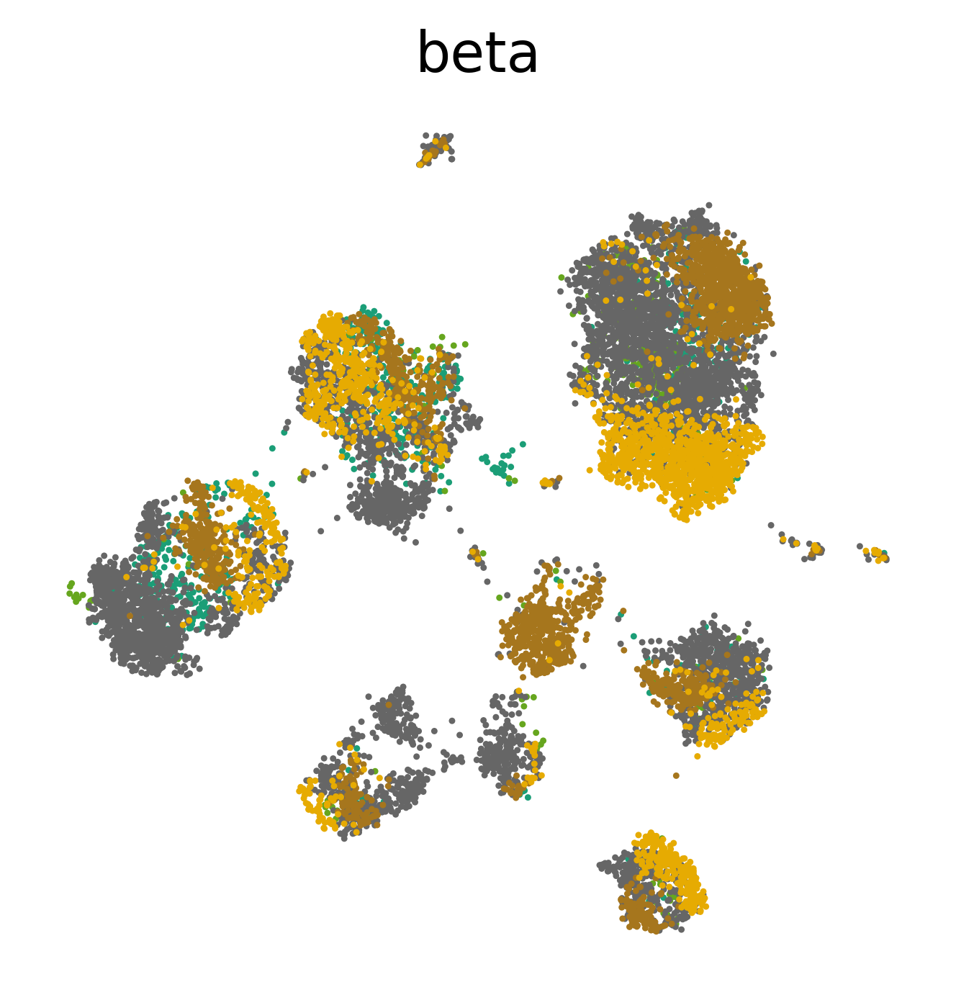

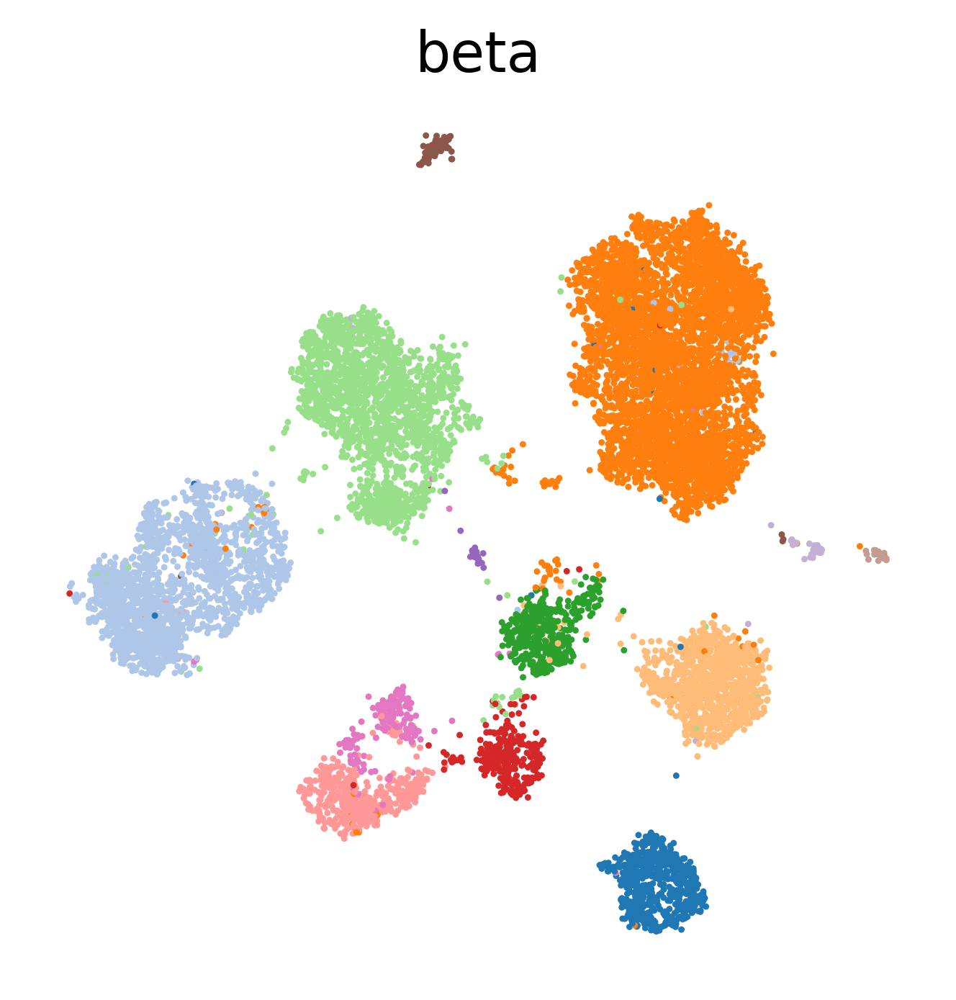

2021-02-18 15:05:29 INFO     Epoch 5 of 100, Train Loss: 0.097
2021-02-18 15:05:29 INFO     Reconstruction loss, hsic: 0.093701, 0.001295
2021-02-18 15:05:34 INFO     Epoch 10 of 100, Train Loss: 0.086
2021-02-18 15:05:34 INFO     Reconstruction loss, hsic: 0.090443, 0.001075
2021-02-18 15:05:39 INFO     Epoch 15 of 100, Train Loss: 0.081
2021-02-18 15:05:39 INFO     Reconstruction loss, hsic: 0.079121, 0.001456
2021-02-18 15:05:43 INFO     Epoch 20 of 100, Train Loss: 0.078
2021-02-18 15:05:43 INFO     Reconstruction loss, hsic: 0.077685, 0.000836
2021-02-18 15:05:48 INFO     Epoch 25 of 100, Train Loss: 0.075
2021-02-18 15:05:48 INFO     Reconstruction loss, hsic: 0.074201, 0.001606
2021-02-18 15:05:53 INFO     Epoch 30 of 100, Train Loss: 0.073
2021-02-18 15:05:53 INFO     Reconstruction loss, hsic: 0.076336, 0.000899
2021-02-18 15:05:58 INFO     Epoch 35 of 100, Train Loss: 0.071
2021-02-18 15:05:58 INFO     Reconstruction loss, hsic: 0.072939, 0.001026
2021-02-18 15:06:02 INFO    

95.0461094379425 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


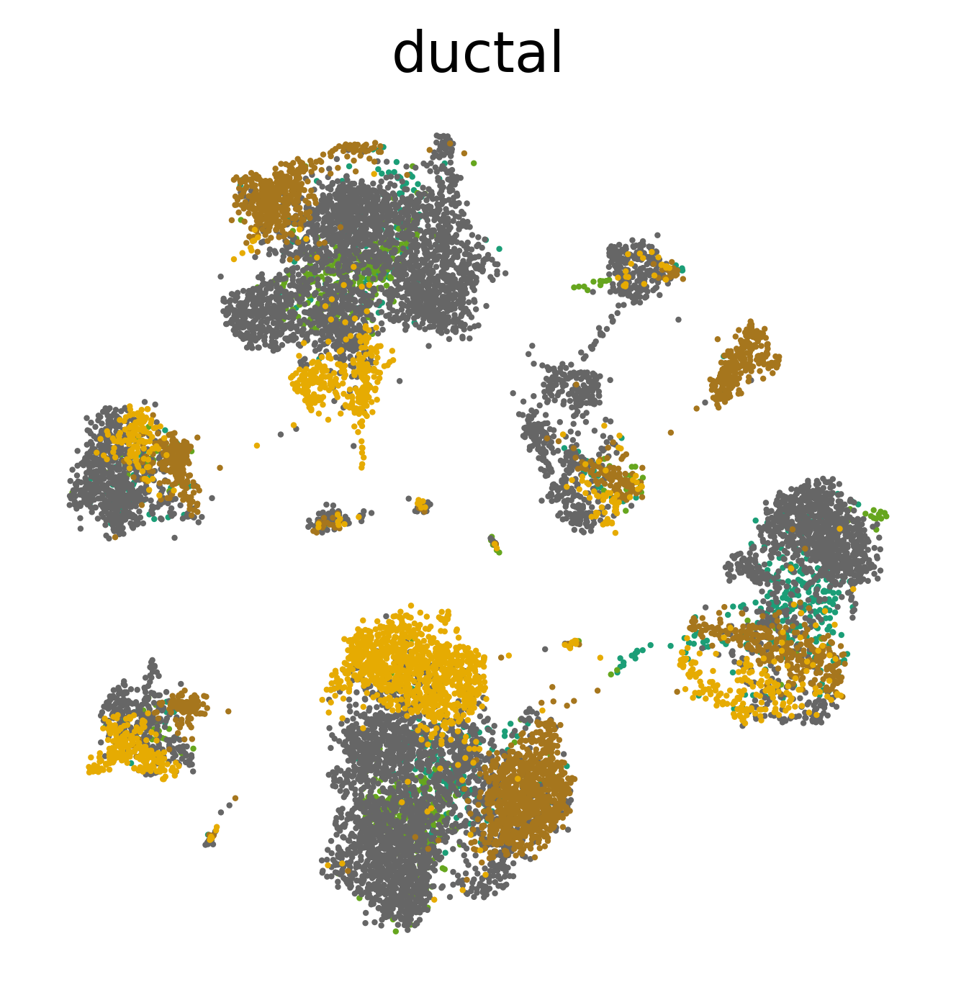

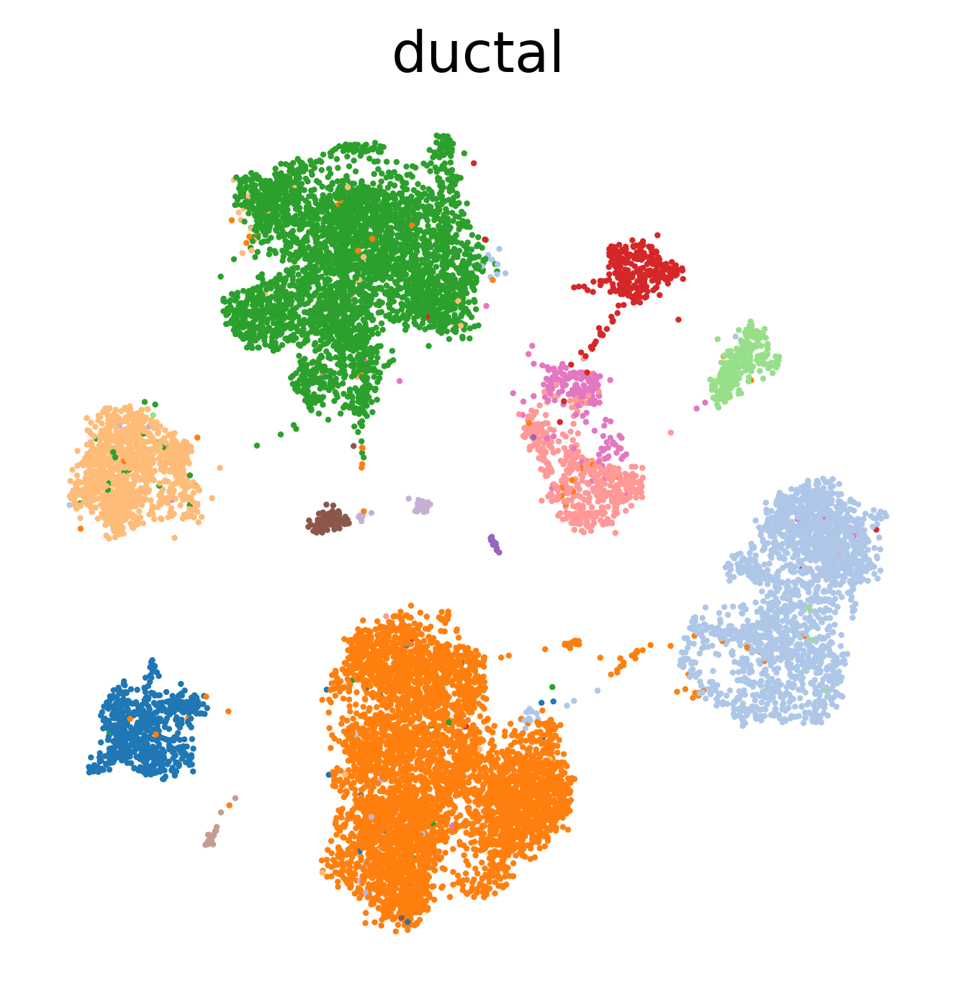

2021-02-18 15:07:15 INFO     Epoch 5 of 100, Train Loss: 0.102
2021-02-18 15:07:15 INFO     Reconstruction loss, hsic: 0.101128, 0.001825
2021-02-18 15:07:20 INFO     Epoch 10 of 100, Train Loss: 0.091
2021-02-18 15:07:20 INFO     Reconstruction loss, hsic: 0.080465, 0.001410
2021-02-18 15:07:26 INFO     Epoch 15 of 100, Train Loss: 0.086
2021-02-18 15:07:26 INFO     Reconstruction loss, hsic: 0.087721, 0.001890
2021-02-18 15:07:31 INFO     Epoch 20 of 100, Train Loss: 0.082
2021-02-18 15:07:31 INFO     Reconstruction loss, hsic: 0.077747, 0.001572
2021-02-18 15:07:36 INFO     Epoch 25 of 100, Train Loss: 0.079
2021-02-18 15:07:36 INFO     Reconstruction loss, hsic: 0.082530, 0.001576
2021-02-18 15:07:42 INFO     Epoch 30 of 100, Train Loss: 0.077
2021-02-18 15:07:42 INFO     Reconstruction loss, hsic: 0.077484, 0.001661
2021-02-18 15:07:47 INFO     Epoch 35 of 100, Train Loss: 0.076
2021-02-18 15:07:47 INFO     Reconstruction loss, hsic: 0.075591, 0.001626
2021-02-18 15:07:52 INFO    

105.46115922927856 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


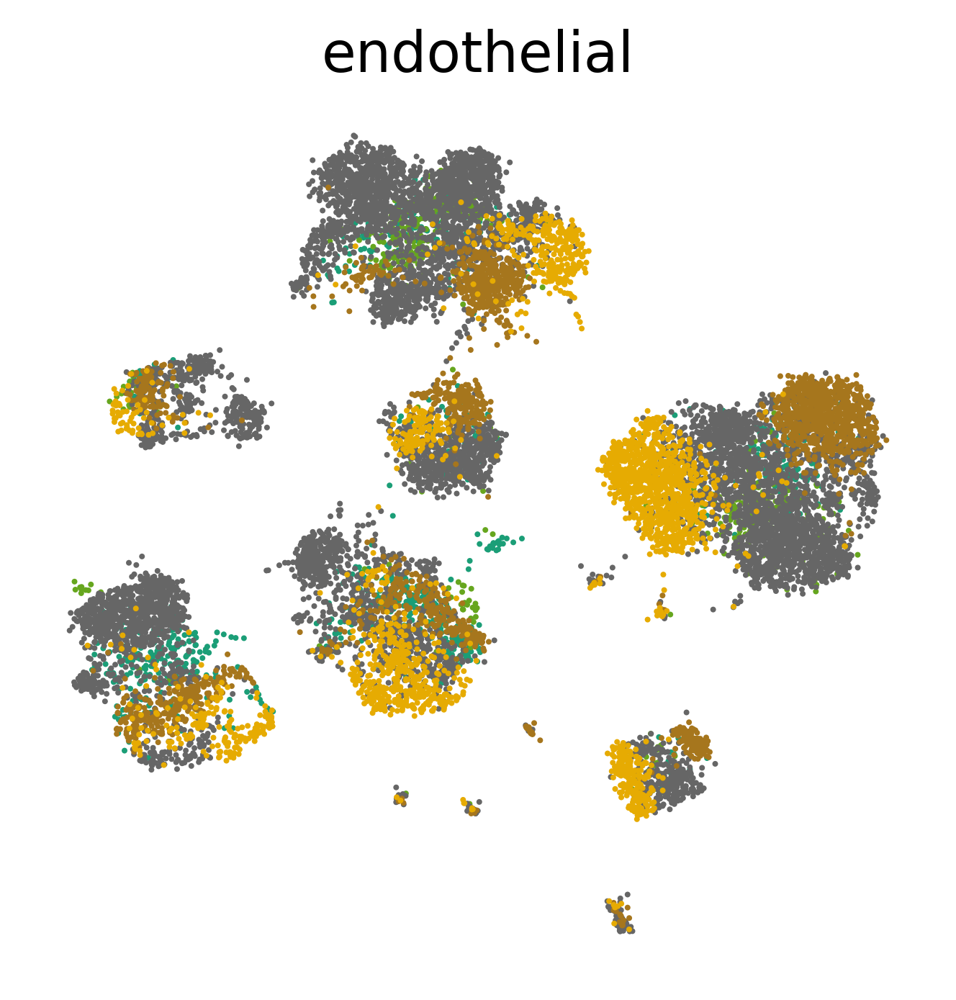

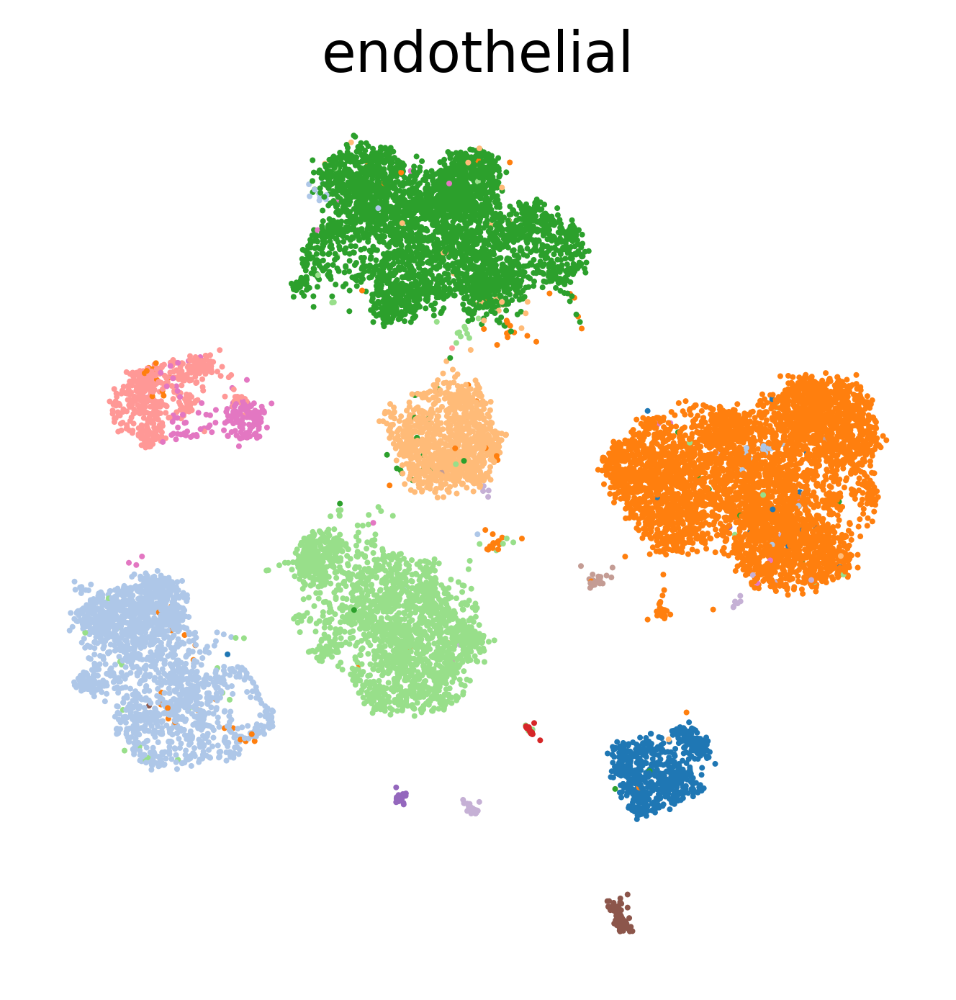

2021-02-18 15:09:12 INFO     Epoch 5 of 100, Train Loss: 0.102
2021-02-18 15:09:12 INFO     Reconstruction loss, hsic: 0.087865, 0.008521
2021-02-18 15:09:18 INFO     Epoch 10 of 100, Train Loss: 0.092
2021-02-18 15:09:18 INFO     Reconstruction loss, hsic: 0.095579, 0.000000
2021-02-18 15:09:23 INFO     Epoch 15 of 100, Train Loss: 0.086
2021-02-18 15:09:23 INFO     Reconstruction loss, hsic: 0.085865, 0.007811
2021-02-18 15:09:29 INFO     Epoch 20 of 100, Train Loss: 0.082
2021-02-18 15:09:29 INFO     Reconstruction loss, hsic: 0.069231, 0.004823
2021-02-18 15:09:35 INFO     Epoch 25 of 100, Train Loss: 0.080
2021-02-18 15:09:35 INFO     Reconstruction loss, hsic: 0.075972, 0.004253
2021-02-18 15:09:40 INFO     Epoch 30 of 100, Train Loss: 0.078
2021-02-18 15:09:40 INFO     Reconstruction loss, hsic: 0.070476, 0.002008
2021-02-18 15:09:46 INFO     Epoch 35 of 100, Train Loss: 0.077
2021-02-18 15:09:46 INFO     Reconstruction loss, hsic: 0.086940, 0.006662
2021-02-18 15:09:51 INFO    

107.6094241142273 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


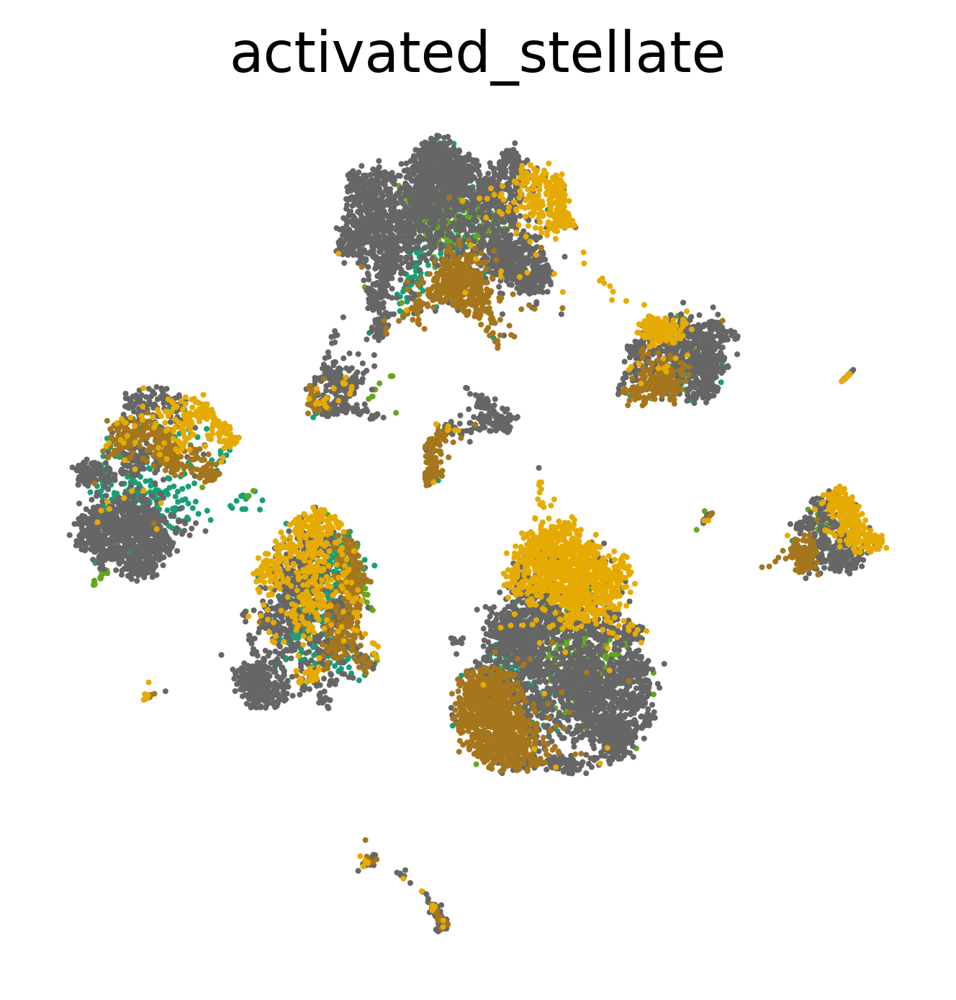

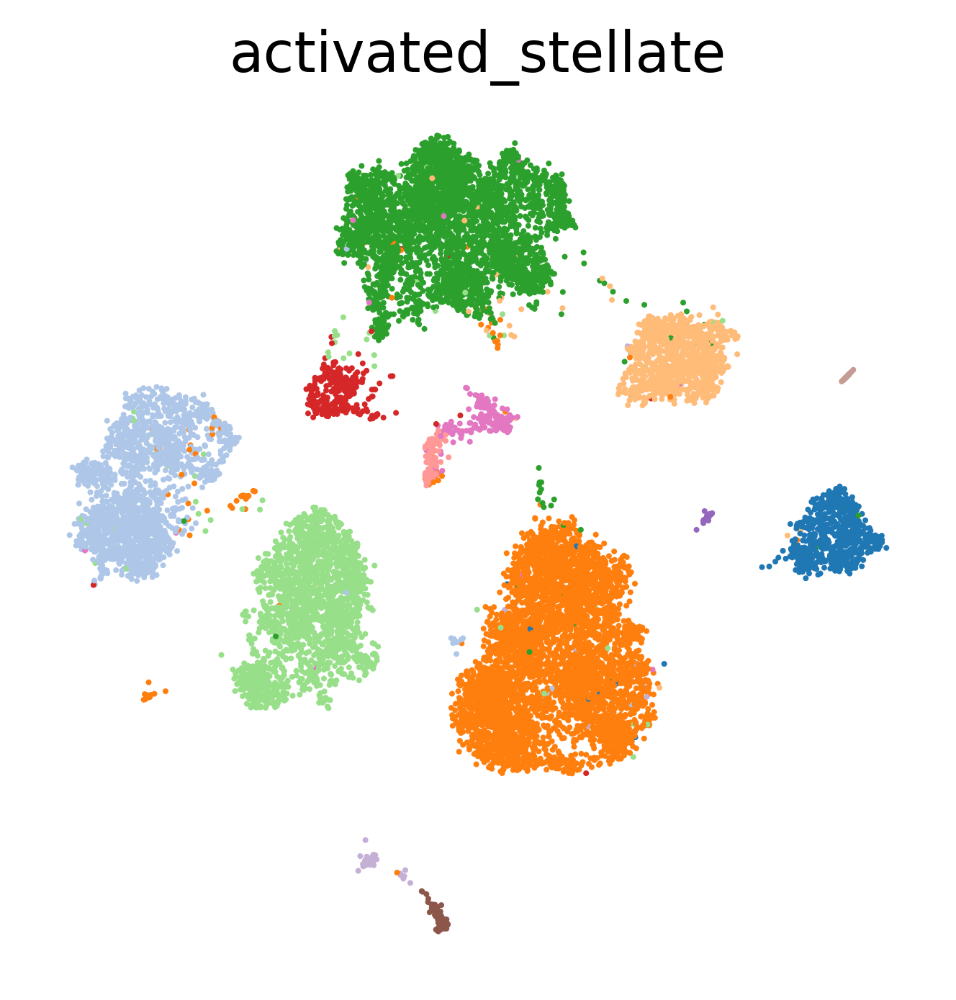

2021-02-18 15:11:13 INFO     Epoch 5 of 100, Train Loss: 0.104
2021-02-18 15:11:13 INFO     Reconstruction loss, hsic: 0.103744, 0.002721
2021-02-18 15:11:19 INFO     Epoch 10 of 100, Train Loss: 0.093
2021-02-18 15:11:19 INFO     Reconstruction loss, hsic: 0.092052, 0.002111
2021-02-18 15:11:26 INFO     Epoch 15 of 100, Train Loss: 0.088
2021-02-18 15:11:26 INFO     Reconstruction loss, hsic: 0.088698, 0.002664
2021-02-18 15:11:33 INFO     Epoch 20 of 100, Train Loss: 0.084
2021-02-18 15:11:33 INFO     Reconstruction loss, hsic: 0.084913, 0.001587
2021-02-18 15:11:39 INFO     Epoch 25 of 100, Train Loss: 0.082
2021-02-18 15:11:39 INFO     Reconstruction loss, hsic: 0.076903, 0.002180
2021-02-18 15:11:46 INFO     Epoch 30 of 100, Train Loss: 0.080
2021-02-18 15:11:46 INFO     Reconstruction loss, hsic: 0.083534, 0.001737
2021-02-18 15:11:53 INFO     Epoch 35 of 100, Train Loss: 0.078
2021-02-18 15:11:53 INFO     Reconstruction loss, hsic: 0.086363, 0.001325
2021-02-18 15:11:59 INFO    

121.1483268737793 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


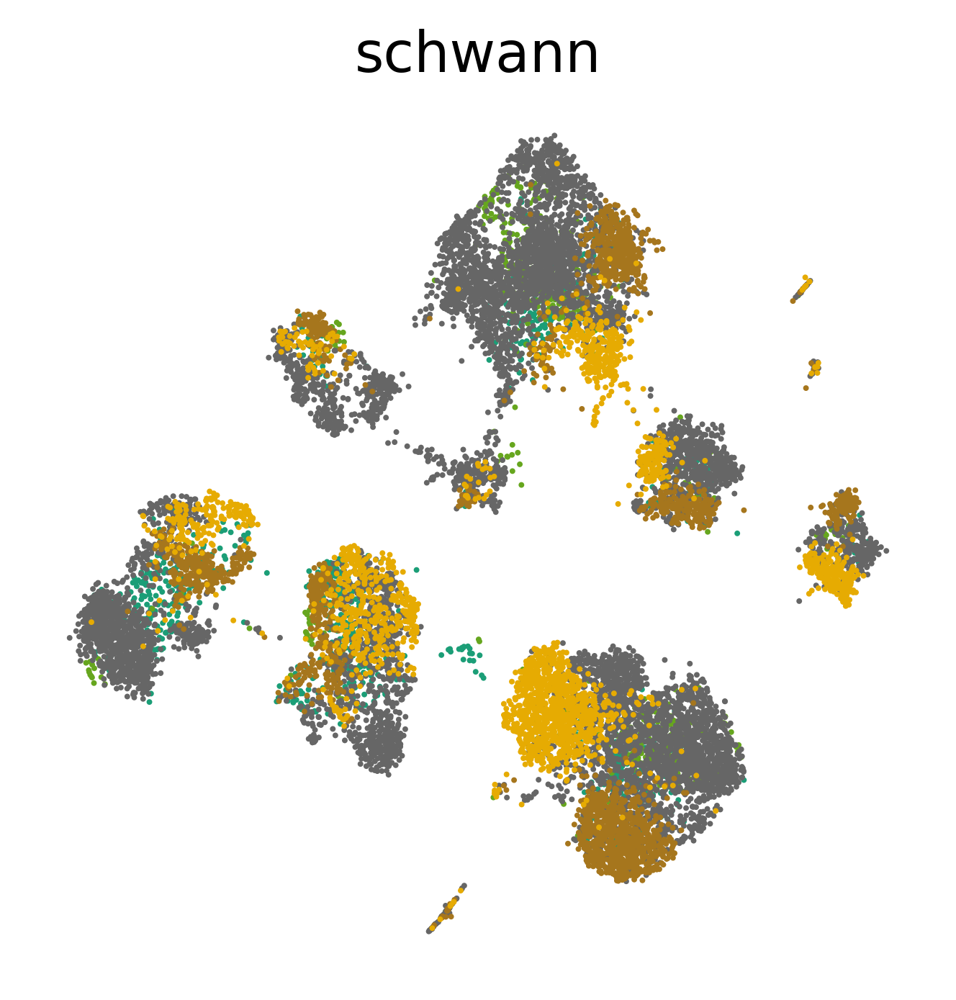

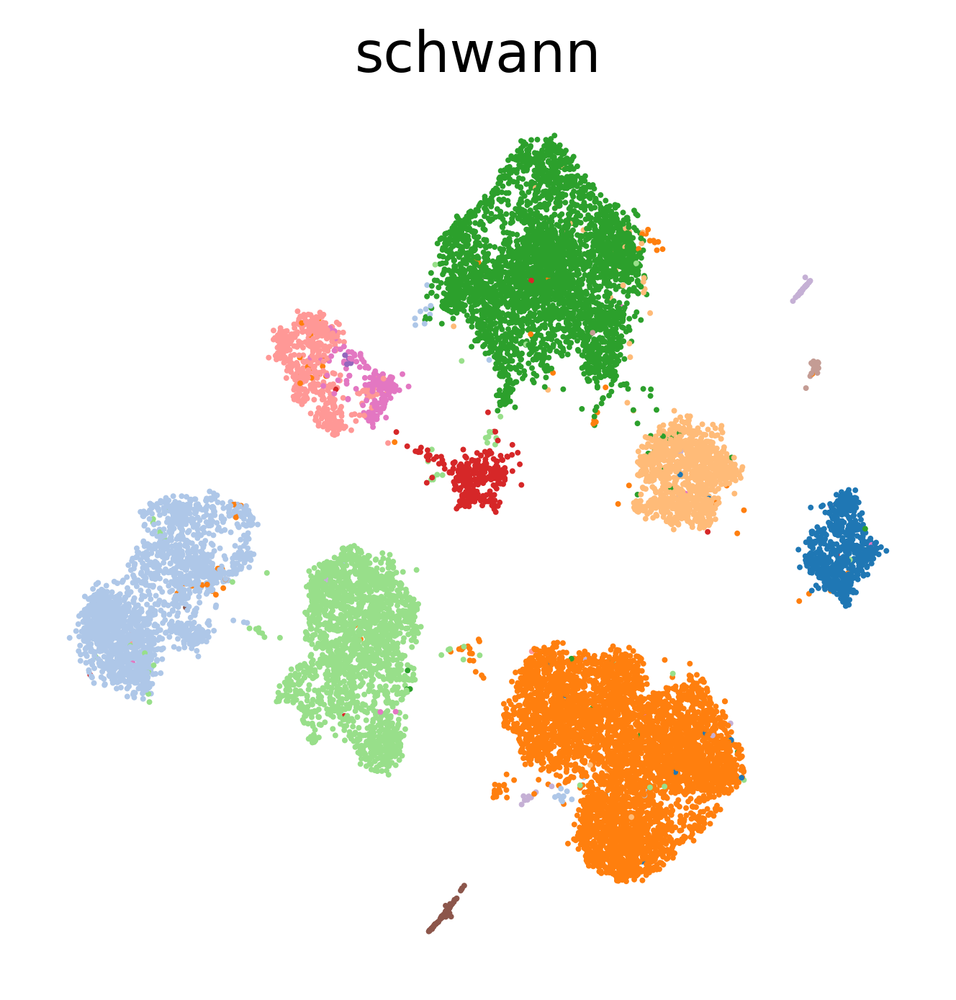

2021-02-18 15:13:24 INFO     Epoch 5 of 100, Train Loss: 0.105
2021-02-18 15:13:24 INFO     Reconstruction loss, hsic: 0.098398, 0.001558
2021-02-18 15:13:30 INFO     Epoch 10 of 100, Train Loss: 0.094
2021-02-18 15:13:30 INFO     Reconstruction loss, hsic: 0.096613, 0.002776
2021-02-18 15:13:35 INFO     Epoch 15 of 100, Train Loss: 0.088
2021-02-18 15:13:35 INFO     Reconstruction loss, hsic: 0.080087, 0.002213
2021-02-18 15:13:41 INFO     Epoch 20 of 100, Train Loss: 0.085
2021-02-18 15:13:41 INFO     Reconstruction loss, hsic: 0.089236, 0.003347
2021-02-18 15:13:46 INFO     Epoch 25 of 100, Train Loss: 0.082
2021-02-18 15:13:46 INFO     Reconstruction loss, hsic: 0.085336, 0.002560
2021-02-18 15:13:51 INFO     Epoch 30 of 100, Train Loss: 0.080
2021-02-18 15:13:51 INFO     Reconstruction loss, hsic: 0.084098, 0.002021
2021-02-18 15:13:57 INFO     Epoch 35 of 100, Train Loss: 0.078
2021-02-18 15:13:57 INFO     Reconstruction loss, hsic: 0.076942, 0.001929
2021-02-18 15:14:02 INFO    

108.54489493370056 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


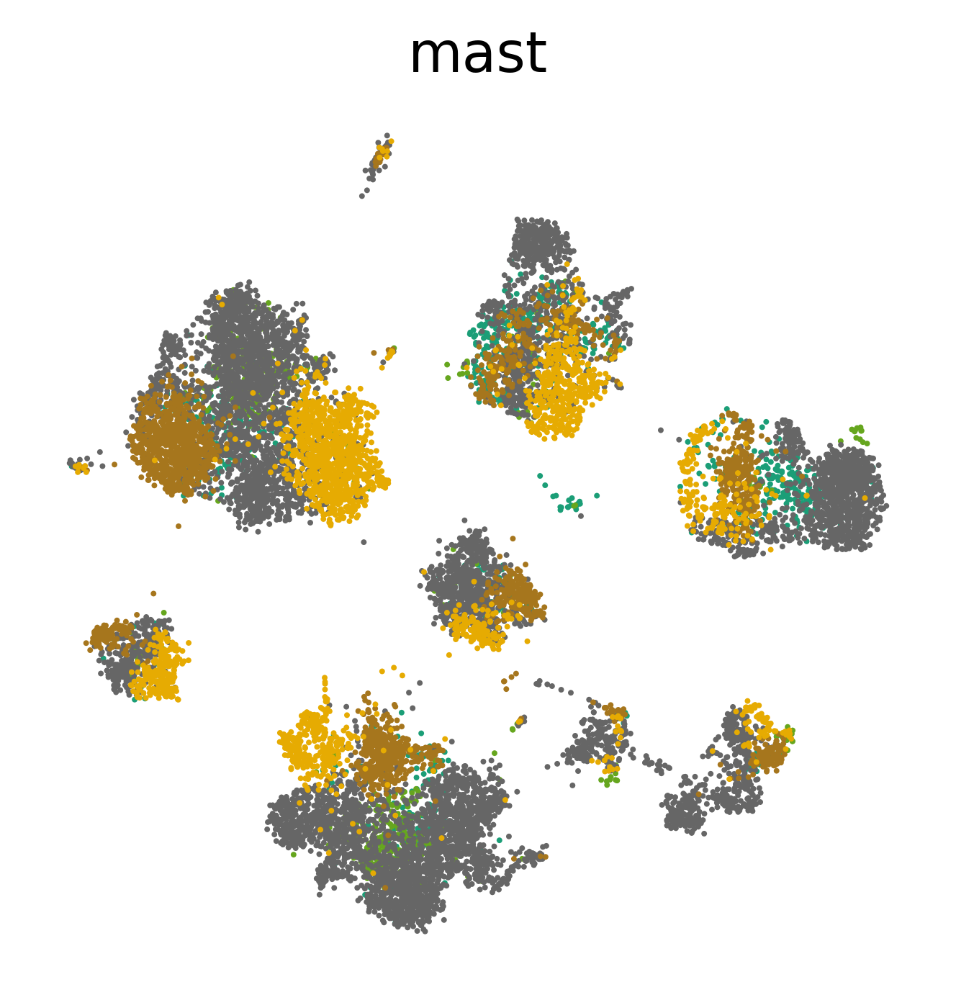

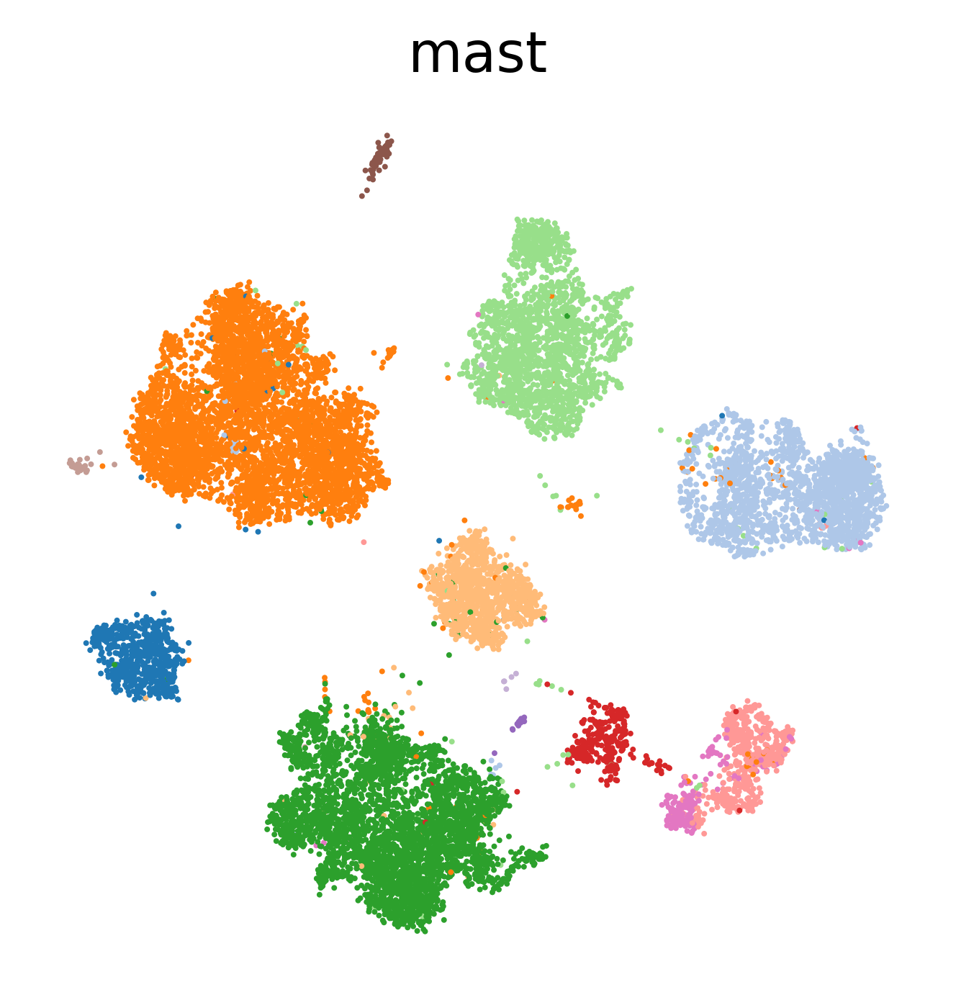

2021-02-18 15:15:25 INFO     Epoch 5 of 100, Train Loss: 0.105
2021-02-18 15:15:25 INFO     Reconstruction loss, hsic: 0.105172, 0.004194
2021-02-18 15:15:30 INFO     Epoch 10 of 100, Train Loss: 0.094
2021-02-18 15:15:30 INFO     Reconstruction loss, hsic: 0.084149, 0.002640
2021-02-18 15:15:35 INFO     Epoch 15 of 100, Train Loss: 0.088
2021-02-18 15:15:35 INFO     Reconstruction loss, hsic: 0.084604, 0.004124
2021-02-18 15:15:41 INFO     Epoch 20 of 100, Train Loss: 0.085
2021-02-18 15:15:41 INFO     Reconstruction loss, hsic: 0.078614, 0.003683
2021-02-18 15:15:46 INFO     Epoch 25 of 100, Train Loss: 0.082
2021-02-18 15:15:46 INFO     Reconstruction loss, hsic: 0.070097, 0.002981
2021-02-18 15:15:52 INFO     Epoch 30 of 100, Train Loss: 0.080
2021-02-18 15:15:52 INFO     Reconstruction loss, hsic: 0.085357, 0.004606
2021-02-18 15:15:57 INFO     Epoch 35 of 100, Train Loss: 0.079
2021-02-18 15:15:57 INFO     Reconstruction loss, hsic: 0.080556, 0.003991
2021-02-18 15:16:03 INFO    

109.2383017539978 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


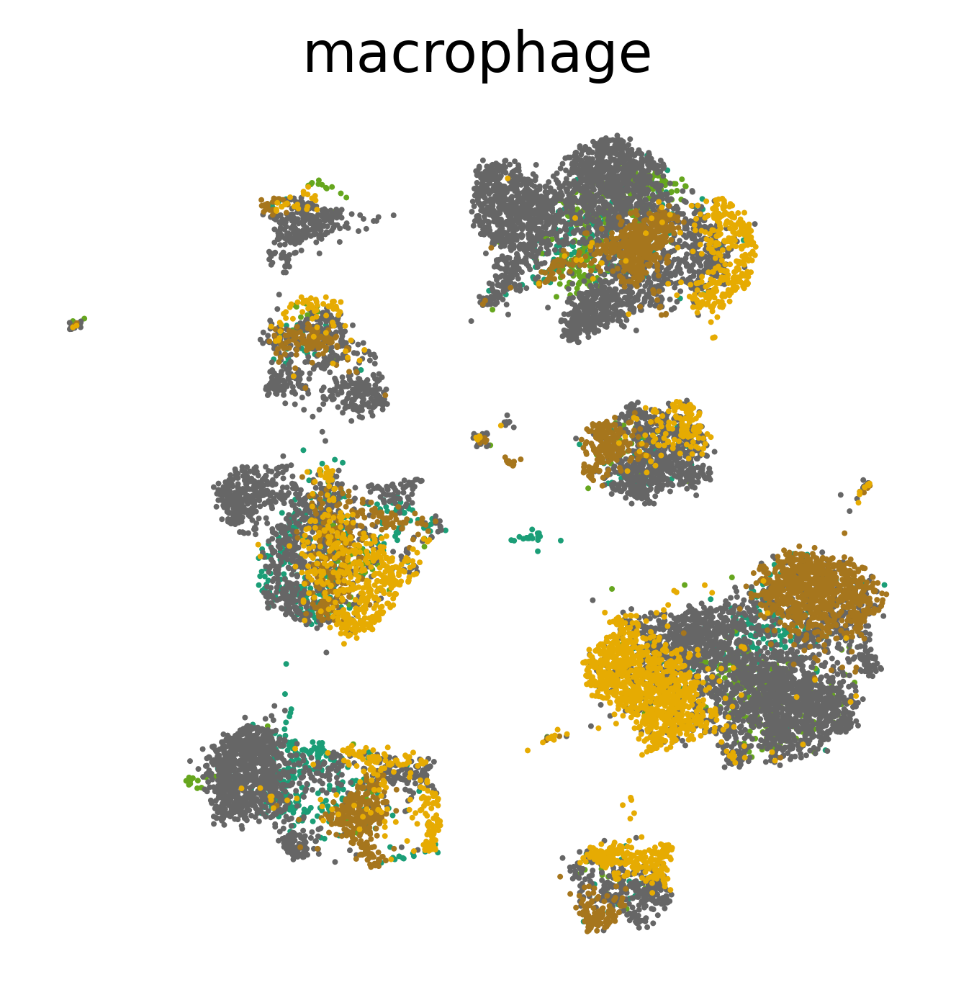

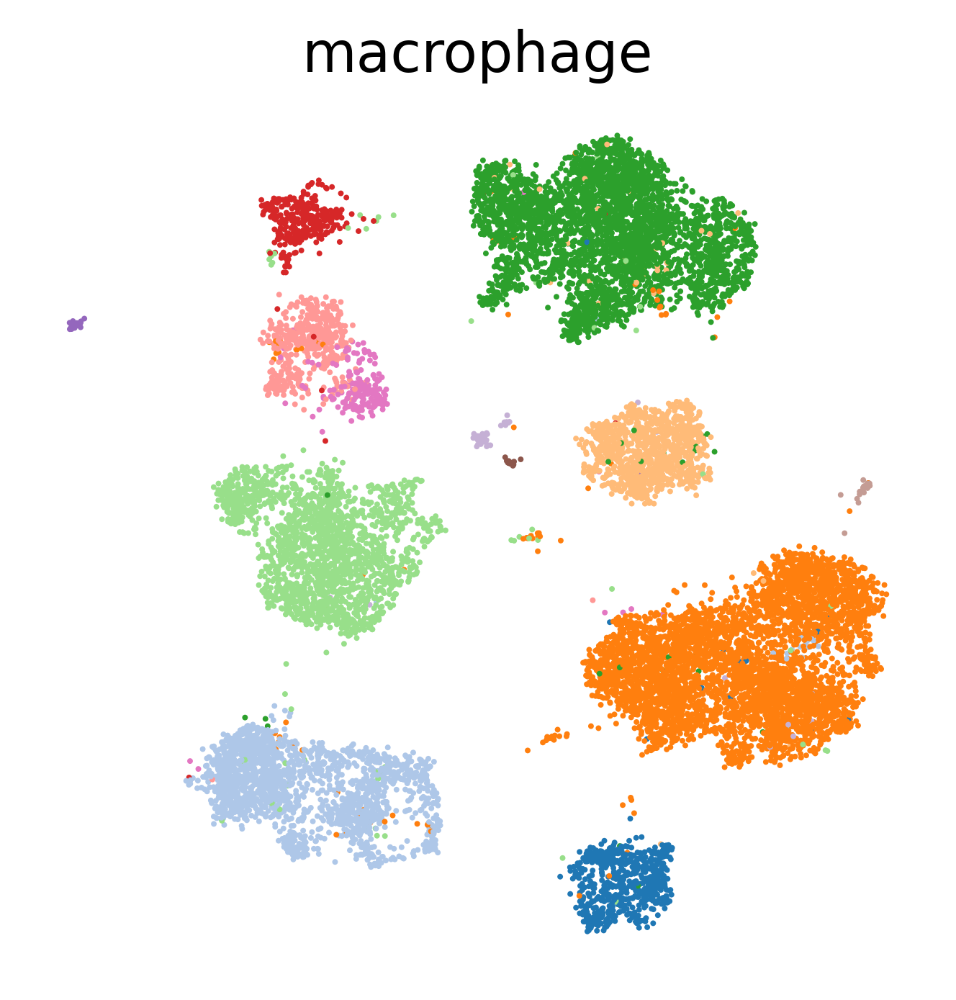

2021-02-18 15:17:25 INFO     Epoch 5 of 100, Train Loss: 0.105
2021-02-18 15:17:25 INFO     Reconstruction loss, hsic: 0.105302, 0.001142
2021-02-18 15:17:31 INFO     Epoch 10 of 100, Train Loss: 0.094
2021-02-18 15:17:31 INFO     Reconstruction loss, hsic: 0.090486, 0.002129
2021-02-18 15:17:36 INFO     Epoch 15 of 100, Train Loss: 0.089
2021-02-18 15:17:36 INFO     Reconstruction loss, hsic: 0.083150, 0.001708
2021-02-18 15:17:41 INFO     Epoch 20 of 100, Train Loss: 0.085
2021-02-18 15:17:41 INFO     Reconstruction loss, hsic: 0.086175, 0.002126
2021-02-18 15:17:47 INFO     Epoch 25 of 100, Train Loss: 0.082
2021-02-18 15:17:47 INFO     Reconstruction loss, hsic: 0.083490, 0.001833
2021-02-18 15:17:52 INFO     Epoch 30 of 100, Train Loss: 0.080
2021-02-18 15:17:52 INFO     Reconstruction loss, hsic: 0.077530, 0.001877
2021-02-18 15:17:58 INFO     Epoch 35 of 100, Train Loss: 0.079
2021-02-18 15:17:58 INFO     Reconstruction loss, hsic: 0.077976, 0.001987
2021-02-18 15:18:03 INFO    

108.61715936660767 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


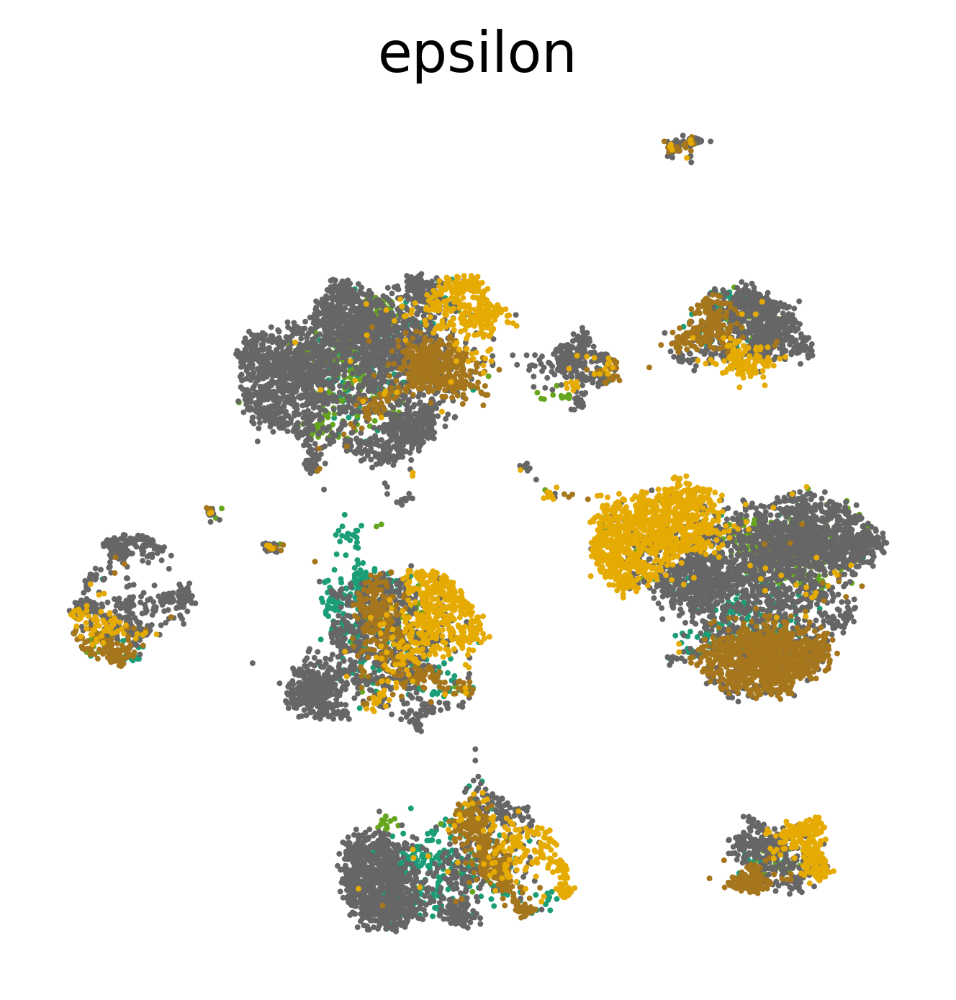

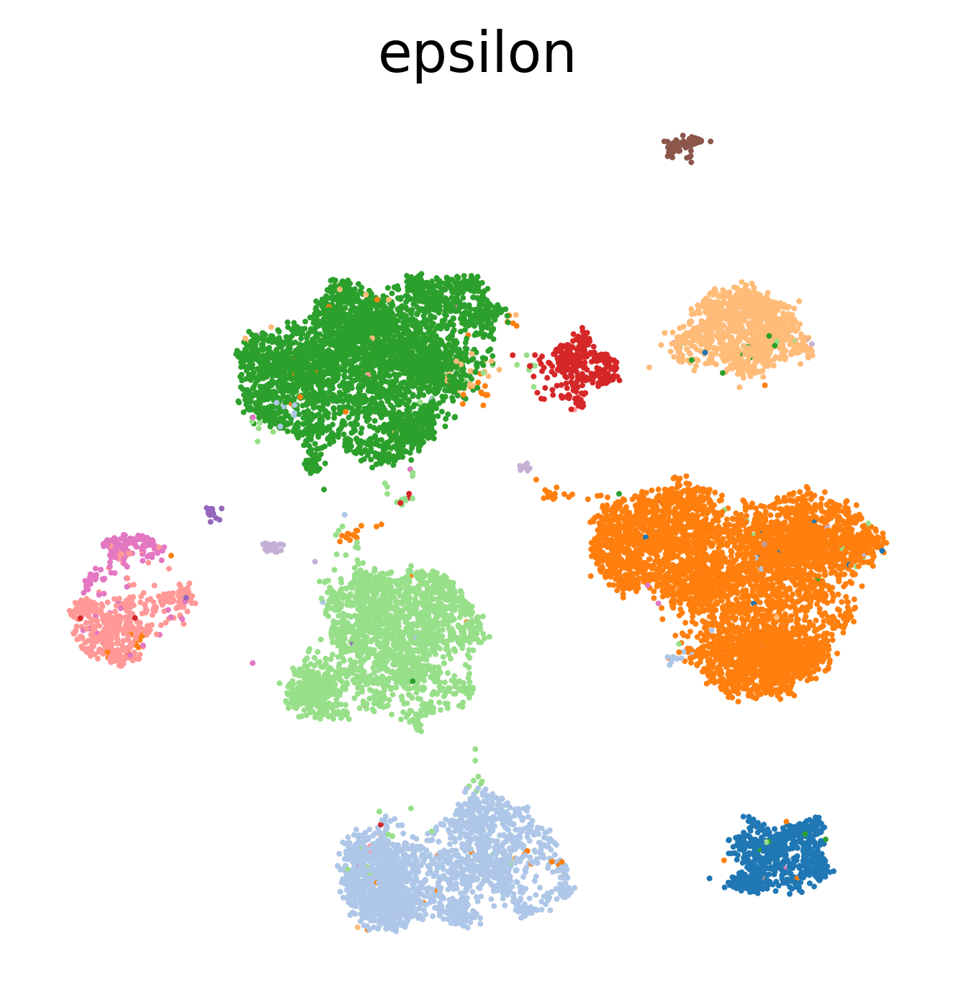

2021-02-18 15:19:25 INFO     Epoch 5 of 100, Train Loss: 0.104
2021-02-18 15:19:25 INFO     Reconstruction loss, hsic: 0.111152, 0.001577
2021-02-18 15:19:31 INFO     Epoch 10 of 100, Train Loss: 0.092
2021-02-18 15:19:31 INFO     Reconstruction loss, hsic: 0.095692, 0.002225
2021-02-18 15:19:36 INFO     Epoch 15 of 100, Train Loss: 0.087
2021-02-18 15:19:36 INFO     Reconstruction loss, hsic: 0.090540, 0.002764
2021-02-18 15:19:41 INFO     Epoch 20 of 100, Train Loss: 0.083
2021-02-18 15:19:41 INFO     Reconstruction loss, hsic: 0.093520, 0.002790
2021-02-18 15:19:47 INFO     Epoch 25 of 100, Train Loss: 0.081
2021-02-18 15:19:47 INFO     Reconstruction loss, hsic: 0.071347, 0.002443
2021-02-18 15:19:52 INFO     Epoch 30 of 100, Train Loss: 0.079
2021-02-18 15:19:52 INFO     Reconstruction loss, hsic: 0.074307, 0.002435
2021-02-18 15:19:57 INFO     Epoch 35 of 100, Train Loss: 0.077
2021-02-18 15:19:57 INFO     Reconstruction loss, hsic: 0.082998, 0.002421
2021-02-18 15:20:03 INFO    

107.05227041244507 seconds


/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


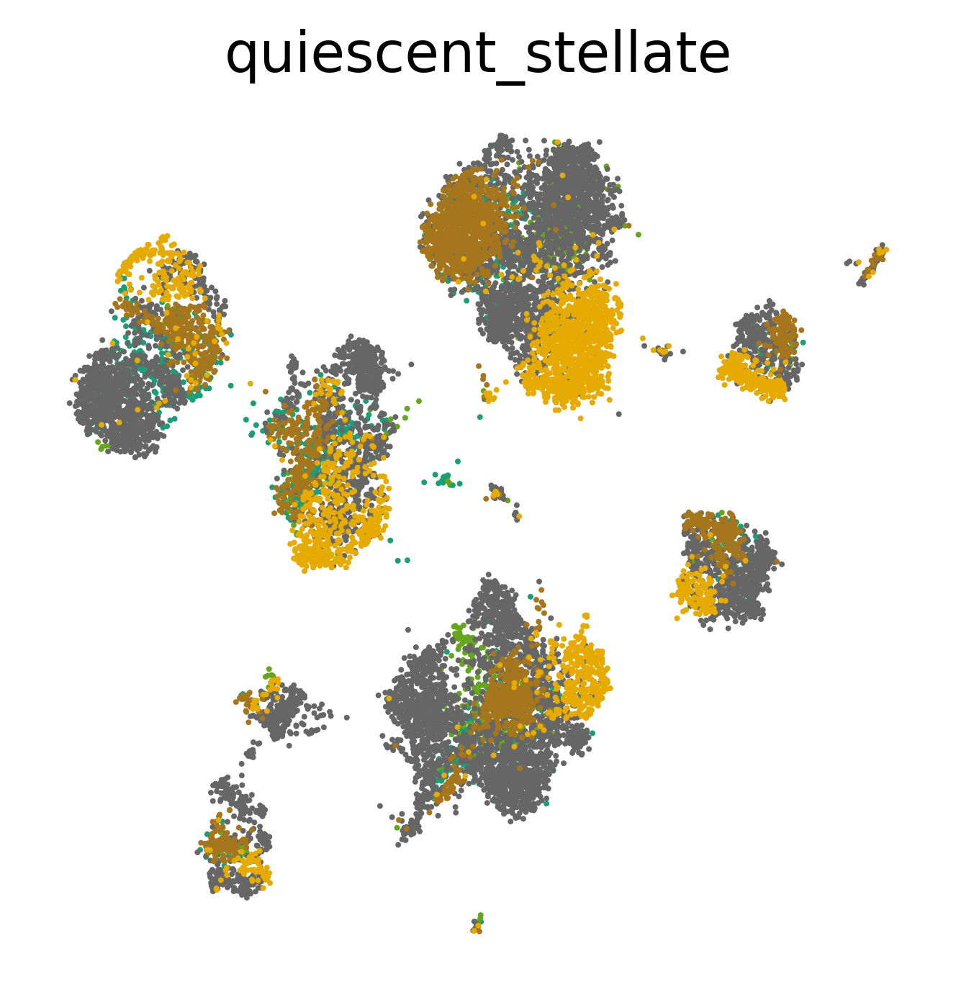

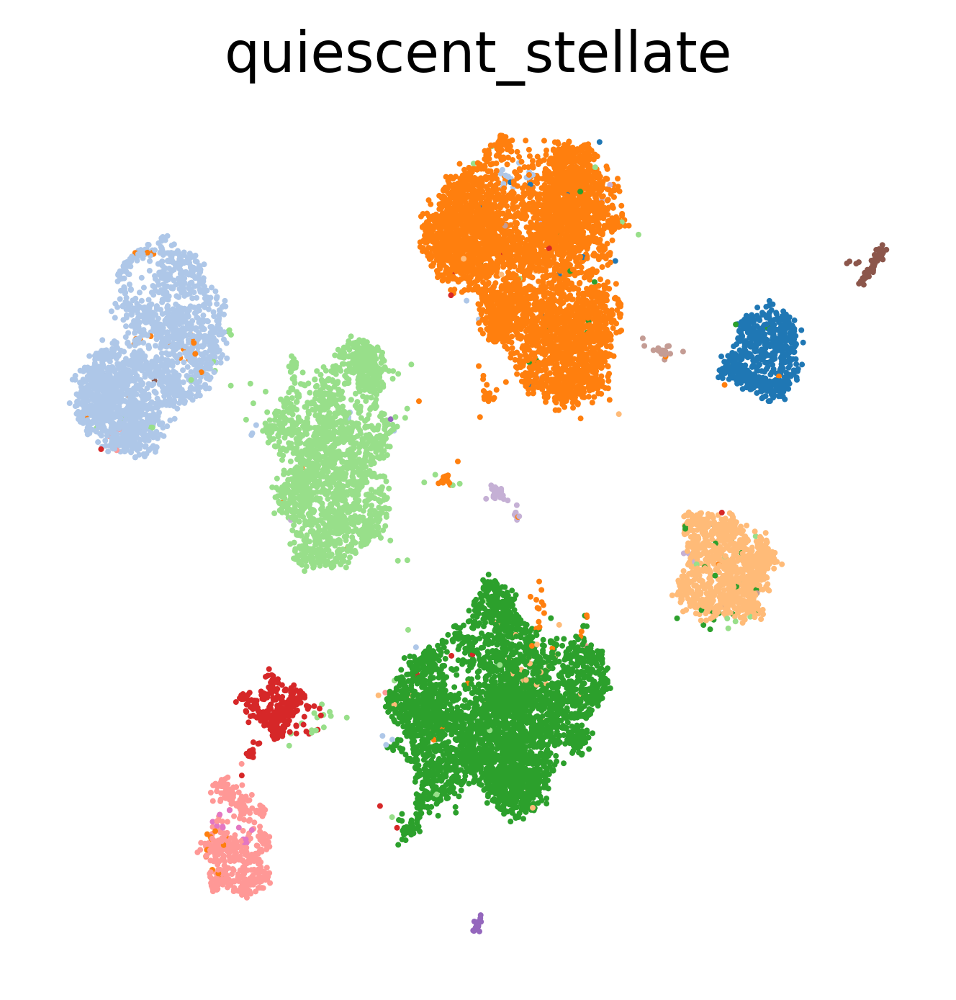

In [10]:
#for dataset in ["pancreas_generalization", "pbmc_generalization"]:
%matplotlib inline
dataset = "pancreas_generalization"
adata = load_data(dataset, normalized=True)
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.obs["study"] = adata.obs["study"].astype("category")

source_batches = ["celseq", "indrop", "fluidigmc1"]
excluded_cells = ["alpha"]

for cell_type in adata.obs['cell_type'].unique():
    excluded_cells = [cell_type]
    source_adata = adata[adata.obs["study"].isin(source_batches)]
    source_adata = source_adata[~source_adata.obs["cell_type"].isin(excluded_cells)]
    target_adata = adata[~adata.obs["study"].isin(source_batches)]
    query_adata = target_adata[target_adata.obs["study"].isin(["smartseq2", 'celseq2'])]
    query_adata = query_adata[~((query_adata.obs['study']  == 'smartseq2') & query_adata.obs['cell_type'].isin(excluded_cells))]

    train_set = DatasetWithConfounder(X=source_adata.X.copy(), Z=LabelEncoder().fit_transform(source_adata.obs.study))
    train_loader = DataLoader(train_set, batch_size=128, shuffle=True)


    decoder_class = BatchDecoder

    model = HilbertSchmidtAE(
        decoder_class(
            configuration={
                "layer_sizes": [adata.X.shape[1], 500, 250, 50],
                "lr": 1e-3,
                "num_batches": len(adata.obs['study'].unique()),
            }
        ),
        configuration={
            "lambda": 1,
        }
    )

    t0 = time.time()
    train(model, train_loader, 100, logging_interval=5)
    print('{} seconds'.format(time.time() - t0))

    eval_adata = AnnData.concatenate(source_adata, query_adata)

    eval_set = DatasetWithConfounder(X=eval_adata.X.copy(), Z=LabelEncoder().fit_transform(eval_adata.obs.study))
    eval_loader = DataLoader(eval_set, batch_size=128)
    results = embed_data(model, eval_loader)

    hd_md_eval_embeddings = AnnData(X=results, obs={
        "study":eval_adata.obs["study"].values,
        "cell_type":eval_adata.obs["cell_type"].values
    })

    hd_md_eval_embeddings.obs["cell_type"] = hd_md_eval_embeddings.obs["cell_type"].astype("category")
    hd_md_eval_embeddings.obs["study"] = hd_md_eval_embeddings.obs["study"].astype("category")

    hd_md_eval_embeddings.write("results/{}/hd-md.h5ad".format(dataset))

    plot_results(
        method, "pancreas_generalization", keys=["study", "cell_type"], title=cell_type, legend_loc=False, batches_to_exclude=[])

In [11]:
test = adata[adata.obs['study'] == 'smartseq2']

In [12]:
test.obs['cell_type'].value_counts()

alpha                 1008
ductal                 444
beta                   308
gamma                  213
acinar                 188
delta                  127
activated_stellate      55
endothelial             21
epsilon                  8
macrophage               7
mast                     7
quiescent_stellate       6
schwann                  2
Name: cell_type, dtype: int64

/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
2021-02-25 11:39:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 11:39:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB

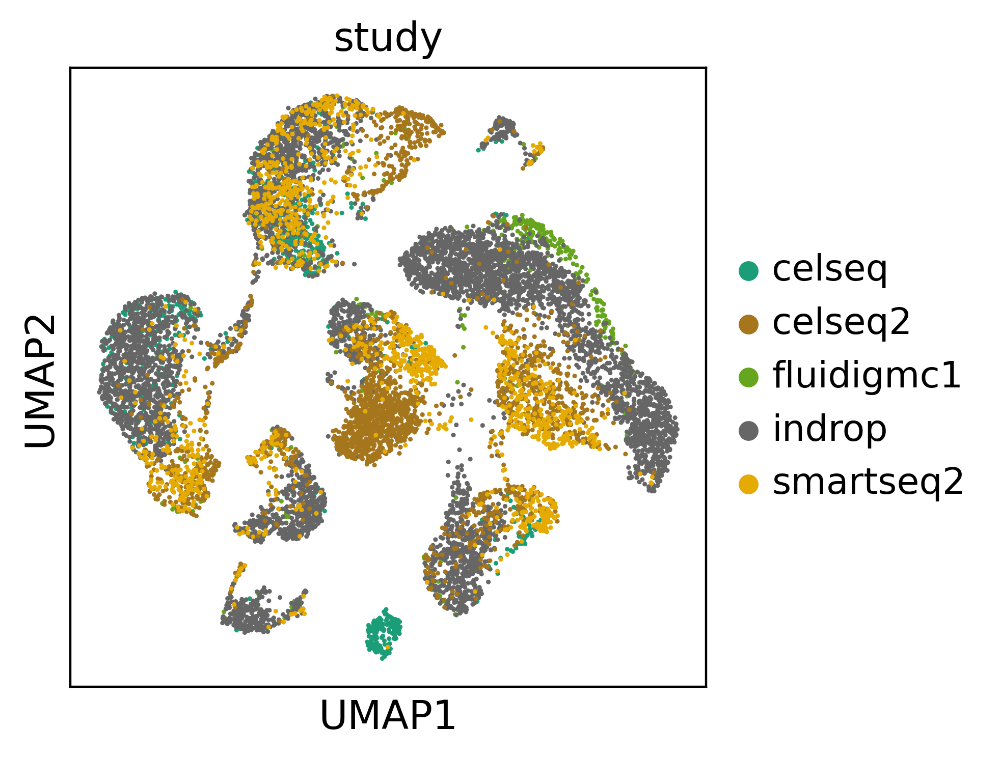

2021-02-25 11:39:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 11:39:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2021-02-25 11:39:15 WARNING  *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify th

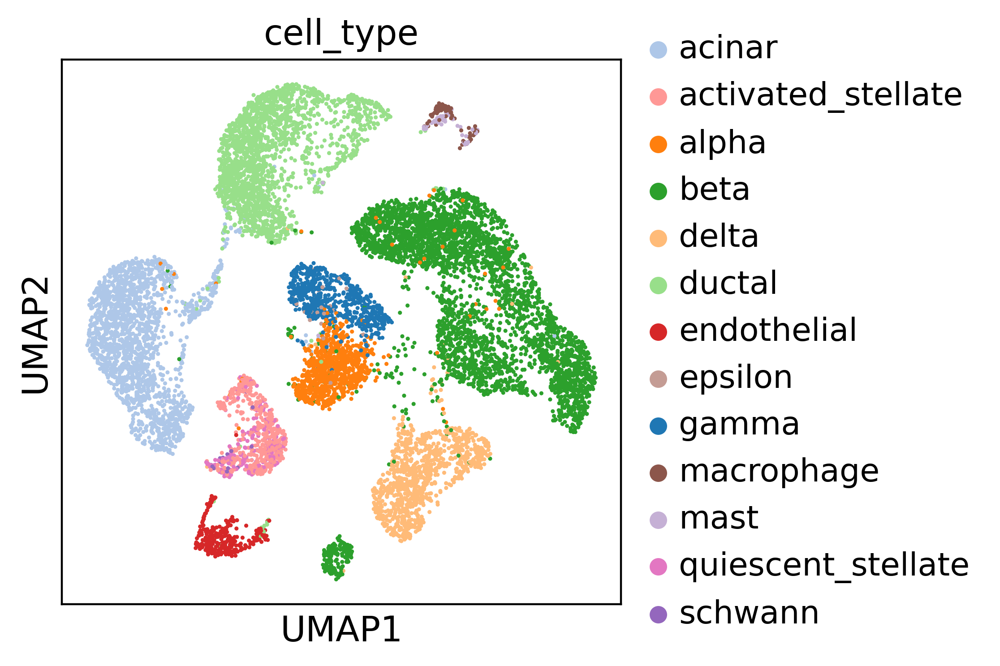

In [31]:
plot_results(
    'desc', "pancreas_generalization", keys=["study", "cell_type"],
    batches_to_exclude=[], frameon=True)